<a href="https://colab.research.google.com/github/yasntrk/Covid-19Analiz/blob/master/Covid_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> **Covid-19 Pandemisi** </center>
<hr>
<br>
<br>
<h2>Covid-19 Nedir?</h2>
<p>• İlk olarak Çin’in Wuhan bölgesinde, 2019 yılı Aralık ayının başında görülüp, Dünya Sağlık Örgütü (DSÖ/WHO) tarafından virüsün resmi adı SARS-CoV-2 (Şiddetli Akut Solunum Sendromu-Koronavirus-2) olarak belirlenmiştir.<p/>
<p>• Dünya Sağlık Örgütü virüsün neden olduğu hastalığı tanımlamak için Covid-19 terimini kullanmaktadır.</p>
<p>• 30 Ocak 2020'de Covid-19, Dünya Sağlık Örgütü tarafından küresel bir sağlık acil durumu ilan edilmiştir.</p>
<p>• 11 Mart 2020 tarihinde ise virüs pandemi, yani küresel salgın hastalık olarak ilan edilmiştir.</p>

<p><small> Kaynak: https://www.acibadem.edu.tr/covid-19/hakkinda</small></p>

#Veri Dosyasını Alma

In [0]:
#Gerekli kütüphaneyi ekleme
import pandas as pd

In [0]:
#Veri dosyasını okuma
global data
data = pd.read_csv('https://raw.githubusercontent.com/datasets/covid-19/master/data/time-series-19-covid-combined.csv')

In [0]:
#NaN degerleri düzenleme
data['Province/State'] = data['Province/State'].fillna(data['Country/Region'])
data[['Confirmed', 'Recovered', 'Deaths']] = data[['Confirmed', 'Recovered', 'Deaths']].fillna(0)
#Tarif formatını düzenleme
data['Date'] = data['Date'].str.replace(r'(\d+)/(\d+)/(\d+)', r'20\3-\1-\2')
data['Date'] = pd.to_datetime(data['Date'])

In [0]:
#Artış miktarını bulmak için fonksiyon
def artis(liste):
  yeni_liste = list()
  yeni_liste.append(0)
  for i in range(len(liste)-1):
    yeni_liste.append(liste[i+1]-liste[i])
  return yeni_liste
  
#Sehir sehir girilen verileri ülke formatına getirmek icin fonksiyon
def ulkenin_toplami(isim, lat, lon):
  global data
  data_t = data[data['Country/Region'] == isim][['Date', 'Deaths', 'Confirmed', 'Recovered']]
  data_t['Date'].astype('category')
  data_t = data_t.groupby('Date').sum()
  data_t['Country/Region'] = isim
  data_t['Province/State'] = isim
  data_t['Lat'] = lat
  data_t['Long'] = lon
  data_t.reset_index(level=None, drop=False, inplace=True, col_level=0, col_fill='')
  data_t = data_t[['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed',
        'Deaths', 'Recovered']]
  data = data.drop(data[data['Country/Region'] == isim].index)
  data = data.append(data_t)

In [0]:
data_map = data.copy()#Haritada sehir verilerini de gormek icin
#Tum verileri ulke formatına indirgedik
for i, row in data[(data['Date'] == data['Date'].max())].iterrows():
  ulke = row['Country/Region']
  if data[(data['Country/Region'] == ulke) & (data['Province/State'] != ulke)].any().any():
    if data[(data['Country/Region'] == ulke) & (data['Province/State'] == ulke)].any().any():
      data.drop(data[(data['Country/Region'] == ulke) & (data['Province/State'] != ulke)].index, inplace=True)
ulkenin_toplami('China', 35.861660, 104.195396)
ulkenin_toplami('Australia', -25.274399, 133.775131)
ulkenin_toplami('Canada', 56.130367, -106.346771)
data.drop(['Province/State'], axis = 1, inplace=True)

#Dünyadaki toplam veriyi gormek icin yeni bir DataFrame olusturduk
datatoplam = data[['Date', 'Deaths', 'Confirmed', 'Recovered']].copy()
datatoplam['Date'] = datatoplam['Date'].astype('category')



#Veriyi Görselleştirme

In [0]:
#Gerrekli kütüphanelerin eklenmesi
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
import folium
from folium.plugins import TimestampedGeoJson
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import matplotlib.colors as mc
import colorsys
from IPython.display import HTML
import random
import datetime

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


<h2>Covid-19 Belirtileri Nelerdir?</h2>
<p>• Yeni Koronavirüs Hastalığı genel olarak ateş, kuru öksürük ve ilerleyen durumlarda solunum güçlüğü ile seyreden bir hastalıktır.<p/>
<p>• Bunlara ilave olarak boğaz ağrısı, baş ağrısı bulantı-kusma, ishal, burun akıntısı, kas-eklem ağrısı, iştahsızlık gibi farklı yakınmalar da görülebilmektedir</p>
<p>• Hastalık bazı genç ve sağlıklı kişilerde hiçbir yakınmaya yol açmazken, bazı kişilerde daha hafif bir klinik tablo ile seyredebilmekte, ancak özellikle, diyabet (şeker hastalığı), tansiyon yüksekliği, akciğer hastalığı, bağışıklık sistemi hastalığı bulunan kişilerde daha ağır ve hastane koşullarında tedavi gerektiren pnömoni (zatürre), akut solunum yetmezliği, böbrek yetmezliği gibi ciddi klinik tabloların ortaya çıkmasına neden olabilmekte, bazı vakalarda ise ölümle sonuçlanabilmektedir. </p>

<p><small> Kaynak: <a>https://www.acibadem.edu.tr/covid-19/hakkinda, #https://www.sozcu.com.tr/2020/saglik/corona-virusunun-yetiskinlerde-ve-cocuklardaki-belirtileri-neler-5765732/</a></small></p>

Text(0.5, 0, 'Belirtiler')

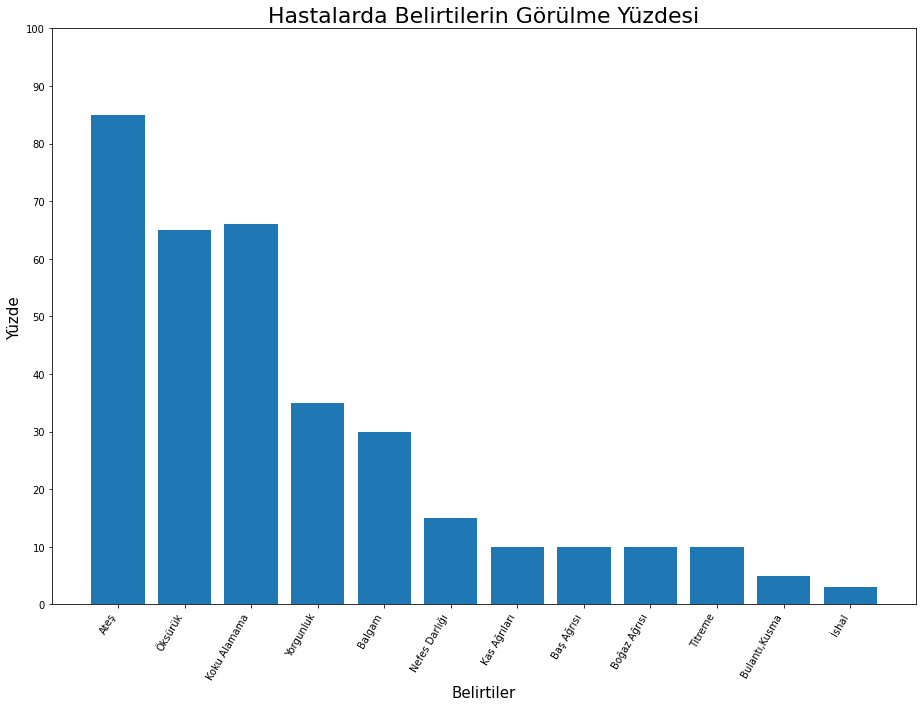

In [0]:
fig = plt.figure()
ax = fig.add_axes([4,4,2,2])
belirtiler = ['Ateş', 'Öksürük', 'Koku Alamama', 'Yorgunluk', 'Balgam','Nefes Darlığı','Kas Ağrıları','Baş Ağrısı','Boğaz Ağrısı', 'Titreme','Bulantı,Kusma','İshal']
yuzdeler = [85,65,66,35,30,15,10,10,10,10,5,3]
ax.bar(belirtiler,yuzdeler)
plt.gca().set_xticklabels(belirtiler, rotation=60, horizontalalignment= 'right')
plt.title("Hastalarda Belirtilerin Görülme Yüzdesi", fontsize=22)
plt.yticks(np.arange(0, 110, step=10))
plt.ylabel('Yüzde', fontsize=15)
plt.xlabel('Belirtiler', fontsize=15)


<h2>Covid-19 Hangi Gruplarda Daha Ağır Seyrediyor?</h2>
<p>• Covid-19 özellikle 65 yaş üstü ve kronik hastalığı olan kişileri etkilediği biliniyor.<p/>
<p>• Kanser hastalarını, hamileleri, bağışıklık sistemi zayıf olanları, yüksek tansiyon hastalarını, şeker hastalarını, akciğer hastalıkları ve KOAH gibi ek hastalıkları olan insanları daha fazla etkilediği gözlemlenmiş bulunmaktadır.</p>
<p>• Covid-19 belirtileri çocuklarda da ender olarak görülse de, hastalığı hafif semptomlarla atlattıkları gözlemlenmektedir.</p>



Text(0.5, 1.0, 'Virüs Bulaşmışsa Ölme Olasılığı')

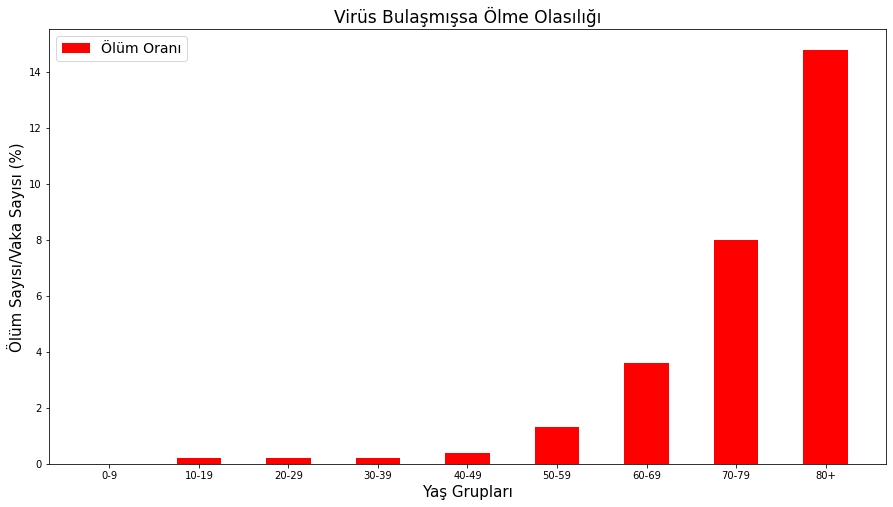

In [0]:
data_by_age =[0,0.2,0.2,0.2,0.4,1.3,3.6,8.0,14.8]
plt.figure(figsize=(15,8))
plt.bar(["0-9" ,"10-19","20-29","30-39","40-49","50-59","60-69","70-79","80+"],
        data_by_age,width=0.5,color="red",label="Ölüm Oranı")
plt.ylabel("Ölüm Sayısı/Vaka Sayısı (%)", fontsize = 15)
plt.xlabel("Yaş Grupları", fontsize = 15)
plt.legend(fontsize=14)
plt.title("Virüs Bulaşmışsa Ölme Olasılığı",fontsize = 17)
#https://www.worldometers.info/coronavirus/coronavirus-age-sex-demographics/

<h2>Türkiye Nüfusunun Yaş Dağılımı</h2>
<p>• Ülkemiz, gelişmekte olan ülkeler kategorisinde yer aldığı için genç nüfus yaşlı nüfusa oranla daha fazla. Yaşlı nüfus ülkenin yaklaşık %11’ini kaplarken, virüsü kolay bir şekilde atlatabilen  genç nüfus neredeyse ülke nüfusunun yarısını oluşturmaktadır.<p/>
<p>• Bu da Türkiye'deki ölüm oranının düşük olmasında bir etken.</p>
<p>• Ülkemiz bu yönden oldukça şanslı görünüyor.</p>



Text(0.5, 1.0, "Türkiye'deki Yaş Gruplarının Dağılımı")

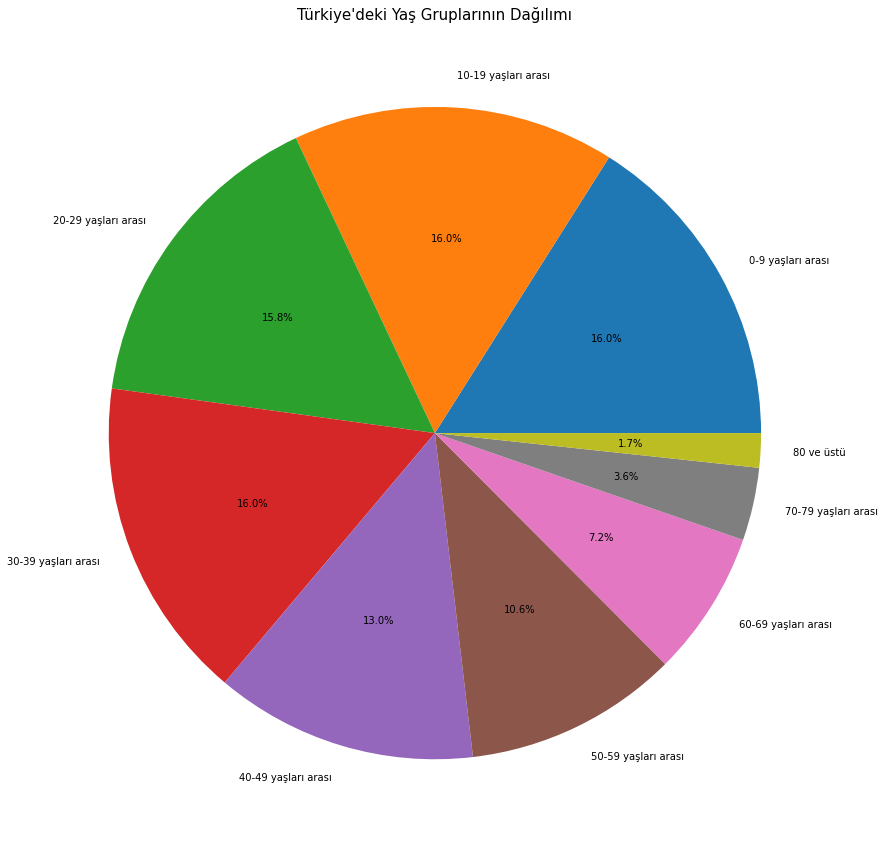

In [0]:
plt.figure(figsize=(15,15))
plt.pie([12796739,12752362,12611764,12804744,10382831,8471980,5755485,2882542,1356424],
        labels=["0-9 yaşları arası","10-19 yaşları arası","20-29 yaşları arası","30-39 yaşları arası",
                "40-49 yaşları arası","50-59 yaşları arası","60-69 yaşları arası","70-79 yaşları arası","80 ve üstü"],autopct='%1.1f%%')
plt.rc(['xtick','ytick'], labelsize=15)
plt.title("Türkiye'deki Yaş Gruplarının Dağılımı", fontsize=15)

#https://tr.wikipedia.org/wiki/T%C3%BCrkiye_demografisi

<h2>COVID-19 nasıl bulaşır?</h2>
<p>• Virüs, kişiden kişiye burun ve / veya ağızdan küçük enfekte damlacıklar yoluyla bulaşabilir, COVID-19 olan bir kişi öksürdüğünde veya nefes verdiğinde yayılabilir.<p/>
<p>• Bu damlacıklar kişinin etrafındaki nesnelere ve yüzeylere inebilir.</p>
<p>• Diğer kişiler daha sonra bu nesnelere ve / veya yüzeylere dokunarak enfeksiyonu kapar, sonra gözlerine ve / veya burnuna ve / veya ağzına dokunur.</p>
<p>• İnsanlar ayrıca, COVID-19'lu damlacıkları öksüren veya nefes veren bir kişiden damlacıklarla nefes aldıklarında da bulaşabilirler.</p>
<p>• Bu, hasta olan bir kişiden en az 1 metre uzaklıktaki sosyal mesafenin önemini açıklar.</p>
<p>• Dünyadaki vaka değerlerine baktığımızda ise ülkemizde virüsün ilk görülme tarihine yakın olan 17 Mart civarında bir kırılma noktası gerçekleşmiş ve artış çok daha hızlı gerçekleşmiş. Dünya’da enfekte olmuş kişi sayısı milyonlara ulaşmış durumda. </p>
<p><small> <a>Kaynak: https://www.gau.edu.tr/duyuru/18754/covid-19</a></small></p>


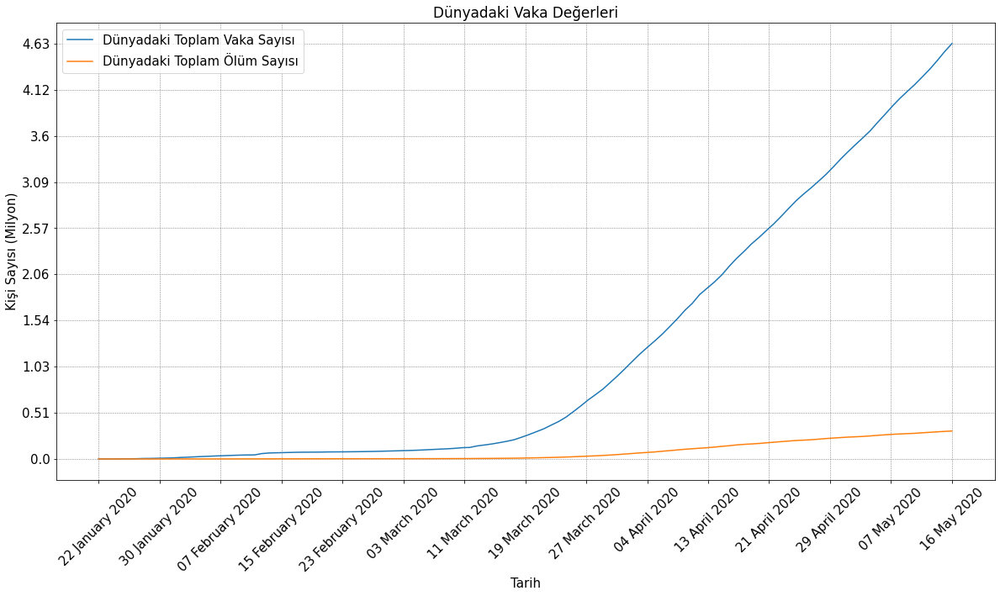

In [0]:
plt.figure(figsize=(20,10))

plt.plot(datatoplam.groupby('Date').sum().index, 
         datatoplam.groupby('Date').sum()['Confirmed'], label = "Dünyadaki Toplam Vaka Sayısı")
plt.plot(datatoplam.groupby('Date').sum().index, 
         datatoplam.groupby('Date').sum()['Deaths'], label = "Dünyadaki Toplam Ölüm Sayısı")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.linspace(0, max(datatoplam.groupby('Date').sum()['Confirmed']), 10), 
           np.round(np.linspace(0, max(datatoplam.groupby('Date').sum()['Confirmed']), 10)/1000000,2))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Kişi Sayısı (Milyon)', fontsize=15)
plt.title('Dünyadaki Vaka Değerleri', fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)


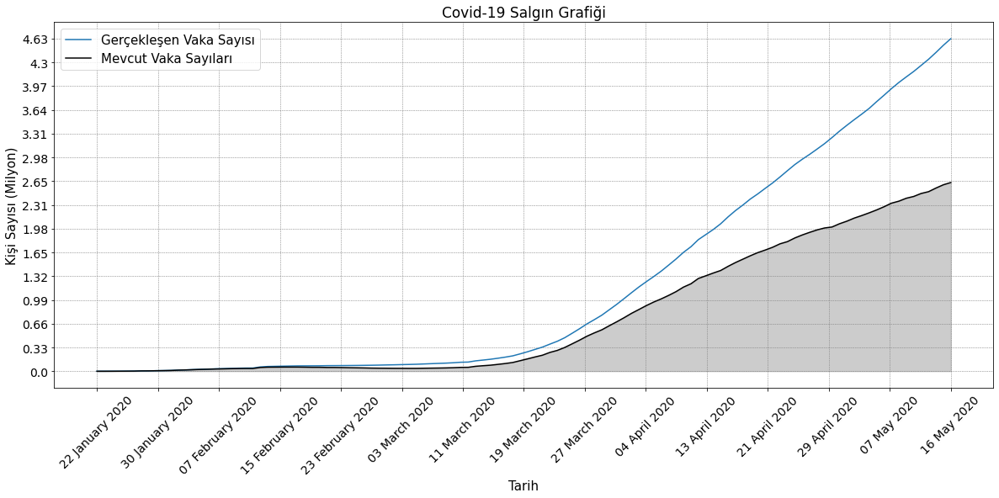

In [0]:
plt.figure(figsize=(20,8))

olum = datatoplam.groupby('Date').sum()['Deaths']
iyilesme = datatoplam.groupby('Date').sum()['Recovered']
vaka = datatoplam.groupby('Date').sum()['Confirmed'] - (olum+iyilesme)

plt.plot(datatoplam.groupby('Date').sum().index, datatoplam.groupby('Date').sum()['Confirmed'], label = "Gerçekleşen Vaka Sayısı")
plt.plot(datatoplam.groupby('Date').sum().index, vaka, color="black", alpha=1, label = "Mevcut Vaka Sayıları")
plt.fill_between(datatoplam.groupby('Date').sum().index, vaka, color="gray", alpha=0.4)


plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.linspace(0, max(datatoplam.groupby('Date').sum()['Confirmed']), 15),
           np.round(np.linspace(0, max(datatoplam.groupby('Date').sum()['Confirmed']), 15)/1000000,2))
           
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Kişi Sayısı (Milyon)', fontsize=15)
plt.title('Covid-19 Salgın Grafiği', fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)

<h2>COVID-19 Neden Hızlı Yayılıyor?</h2>
<p>• Yeni tip koronavirüsün en belirgin özelliklerinden biri hızlı yayılması. Genetik bilimci Prof. Dr. Selim Badur'a göre yeni tip koranavirüs yeni bir antijenik (vücuda girdiğinde antikor oluşmasına yol açan virüs, bakteri, parazit gibi protein yapısında bir madde) tip olması nedeni ile insanlar arasında kendisine karşı gelişmiş bir immünite (bağışıklık) henüz söz konusu değil.<p/>
<p>•  Diğer bir tanımlama ile, ilk kez karşılaşan bu yeni etkene karşı hiçbir insanda daha önceden var olan bir bağışıklık yok; bu nedenle virüs çok süratle yayılıyor.</p>
<p>• Koronavirüsün 2 haftalık kuluçka süresi, hastalık belirtilerini gizliyor ve hastalığın kuluçka süresinde daha zor tespit edilebilmesine yol açıyor. 
<p>• Koronavirüs'ün karşılaştığımız virüs çeşidi ile daha önce tanışmamız oluşumuz virüsün karakteristik özelliklerini bilmemeyişimize neden oldu. Hangi yollarla bulaştığı, virüsün etkileri ve etkilediği organlar gün geçtikçe keşfedilmeye başlandı.İlk başlarda DSÖ dahil birçok kurum yanılgalara dahi düştü.
<p>•Amerika, İtalya gibi ülkeler, virüsü ilk başlarda ciddiye almadılar ve günlük hayatlarına devam ettiler. Festivaller ve kalabalık etkinlikleri düzenleyen İtalya, Sınırlarını kapatmakta geç kalan Amerika hala ağır bedeller ödüyor.
<p>• Çin Halk Cumhuriyeti'nin verileri geç açıklaması da Dünya'nın olayı geç fark etmesine neden oldu
<p> <strong>Yukarıda saydığımız sebepler COVID-19'un hızlı yayılmasında öngördüğümüz büyük etkenler<strong>

In [0]:
total_incidents = data_map[data_map['Confirmed'] > 0]['Confirmed'].sum()

def geojsons(df):
  features = []
  
  for _, row in df.iterrows():
    feature = {
         'type' : 'Feature',
         'geometry' : {
         'type' : 'Point',
         'coordinates' : [row['Long'],row['Lat']]
                          },
            'properties' : {
            'time' : pd.to_datetime(row['Date'], format = '%Y-%m-%d').__str__(),
            'style' : {'color' : ''},
            'icon' : 'circle',
            'iconstyle': {
                'fillColor' : 'red',
                'fillOpacity' : 0.8,
                'stroke' : 'true',
                'radius' : math.pow(abs(row['Confirmed']), 0.22)
              }
          }
     }

    features.append(feature)
  return features
start_geojson = geojsons(data_map[data_map['Confirmed'] > 0])

m = folium.Map(width=1080,height=512,location = [50,30],zoom_start = 3,tiles = 'OpenStreetMap')
               
TimestampedGeoJson(
    start_geojson,
    period = 'P1D',
    duration = 'PT1M',
    transition_time = 200,
    auto_play = True,
).add_to(m)
m

<h2>Salgın Asya'da Başlamasına Rağmen Avrupa ve Amerika Asya'yı Nasıl Geçti?</h2>
<p>• Yeni tip koronavirüsün açığa çıkardığı bir gerçek de sınırların küresel krizler ya da salgınlar karşısında anlamını yitirmesi. Nitekim dünya genelinde 100'den fazla ülkede ve bölgede bu salgın -farklı düzeylerde olsa da- baş göstermiş durumda.<p/>
<p>• Covid-19'un bulaşma zincirindeki yüksek nüfuslu ülkelerin, özellikle İtalya, İspanya ve Amerika'nın önlem almakta gecikmeleri, alınan önlemlerin sınırlı kalması, sağlık alt yapısındaki eksiklikler (tanı merkezlerinin azlığı, genel taramanın yapılmaması vs), toplumsal alışkanlık farklılıklarının getirdiği salgını hafifseme gibi nedenler salgının yayılmasına neden oldu.</p>
<p>• Amerika gibi ülkelerde Covid-19 tedavisinin(ilk başlarda) ücretsiz olmaması insanları zora soktu.
<p>•Virüs'ün ortalama 2 haftalık kuluçka süresinin olduğu biliniyor. Belki de bu 2 haftalık süre içerisinde hasta olan diğer kişilerin çoktan ülkelerine dönmüş olabileceği de bu varsayımlarımız içinde. 
<p>• Aşağıdaki animasyonda birçok ülkedeki vaka sayısının Çin'deki vaka sayısının katlarına ulaştığı görünmektedir. </p>



In [0]:
#Bar yarış grafiğinde kullanmak için veri dosyasının bazı kolonlarından yeni nir df
df = data[['Country/Region', 'Date', 'Confirmed', 'Deaths']]

In [0]:
#Tarih formatını, salgının .inci günü şekline çevirmek için kod bloğu
def kacinci_gun(a):
  return (a - df['Date'].min()).days+(data['Date'].min()-pd.Timestamp('2019-12-01')).days

print("Veri dosyası salgının başlangıcından {} gun sonra yazılmaya başlandı.".format((data['Date'].min()-pd.Timestamp('2019-12-01')).days))
df['Date'] = df['Date'].apply(kacinci_gun)

Veri dosyası salgının başlangıcından 52 gun sonra yazılmaya başlandı.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


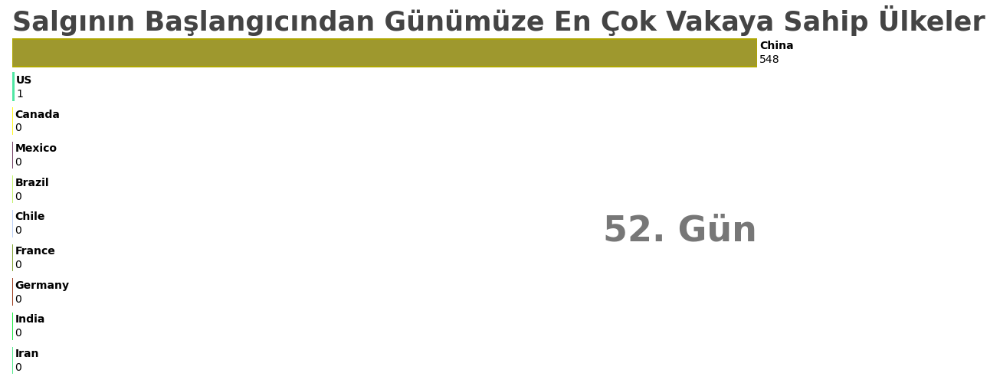

In [0]:
#Veri dosyasındaki en fazla vakaya sahip olan 20 ülkeden bir df olusturduk
current_time = df['Date'].max()
dff = (df[df['Date'].eq(current_time)]
       .sort_values(by='Confirmed', ascending=False)
       .head(20))

#Random renk almak ve rengi hex formatından rgba formatına çeviren fonksiyonlar
def random_renk():
  r = lambda: random.randint(0,255)
  r = '#%02X%02X%02X' % (r(),r(),r())
  return r
  

def transform_color(color, amount = 0.5):
    try:
        c = mc.cnames[color]
    except:
        c = color
        c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

#Bir sözlük olusturup ülkelere random renk atadık
colors = dict()

for i in dff['Country/Region'].tolist():
  colors.update({i: random_renk()})

#Bar yarışı grafiğinin yenileme fonksiyonu
dfb = dff
def draw_barchart(time):
    dff = df[(df['Date'].eq(time)) & (df['Country/Region'].isin(dfb['Country/Region'])) ].sort_values(by='Confirmed', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['Country/Region'], dff['Confirmed'], color=[transform_color(colors[x], 1)+ (0.825,) for x in dff['Country/Region']]
            , height = 0.8, edgecolor =[transform_color(colors[x], 0.9) for x in dff['Country/Region']], linewidth = '2')
    dx = dff['Confirmed'].max() / 300
    for i, (value, name) in enumerate(zip(dff['Confirmed'], dff['Country/Region'])):
        ax.text(value+dx, i+10/50,     name,           size=14, weight=600, ha = 'left', va = 'center')
        ax.text(value+dx, i-10/50,     f'{value:,.0f}',  size=14, ha = 'left', va = 'center')
    # ... polished styles
    ax.text(1, 0.4, str(time)+'. Gün', transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.015, 'Salgının Başlangıcından Günümüze En Çok Vakaya Sahip Ülkeler ', transform=ax.transAxes, size=35, weight=600, color='#444')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis = 'x', colors = '#fff', labelsize = 28)
    ax.set_yticks([])
    ax.set_axisbelow(True)
    ax.margins(0, 0.01)
    #ax.grid(which = 'major', axis = 'x', linestyle = '-')

    plt.locator_params(axis = 'x', nbins = 4)
    plt.box(False)
    plt.subplots_adjust(left = 0.075, right = 0.75, top = 0.825, bottom = 0.05, wspace = 0.2, hspace = 0.2)

#Bar race grafiğini olusturduk ve video olarak çıktısını aldık
fig, ax = plt.subplots(figsize=(20, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range(df['Date'].min(), df['Date'].max()+1))
HTML(animator.to_html5_video())

<h2>ABD’de Koronavirüs Vaka Sayısı Neden Yüksek?</h2>
<p>• Harvard’dan Prof. Dr. Gökhan Hotamışlıgil bu konudu şu yorumları yapıyor:<br>Amerika’nın bu duruma gelmesine 2 kısımda bakmak lazım. Salgının sıra dışı bir virüsle yayıldığı fark edilince ki buna ocak ayı ortaları diyelim, o süreç içerisinde ABD yönetiminin bunu birinci sebep olarak ciddiye almaması, ABD’ye hafif şekilde uğrayacağı yönünde bir söylemle işin üzerine ciddiyetle eğilmemesi… <p/>
<p>• İkinci süreç, geçirdiğimiz 2-3 sene içerisinde ABD’nin çok önemli, bilime dayalı, hastalıklar bakımından bütün tedbirleri alan kuruluşunun yetkinliklerinin azaltılmış olması… Yönetimin bilim insanlarının tavsiyelerinden uzak bir davranış içine girmiş olması. Yetkinlik ve yönetim problemler nedeniyle önlemlerin gecikmesi önemli bir zaman kaybına yol açtı. 60-70 gün gibi bir süreç önlem alınmadan geçiştirildi.</p>
<p>• Amerika başkanı Donald Trump, ekonomik ve siyasi çıkarlarını bu salgının önüne koyarak büyük bir hata yaptı böylelikle tedbirleri çok geç aldı.Salgının yayılımı kontrolden çıktı ve New York gibi eyaletlerde sağlık sistemi gelen büyük dalga karşısında felce uğradı.</p>
<p><strong>Peki buradan çıkarmamız gereken sonuç nedir?</strong>


1.  Bu durum bilim kuruluşlarının önemini ortaya koydu.

2.  Siyasi ve Ekonomik çıkarların halk sağlığının önünde tutulmaması gerektiğini gösterdi.




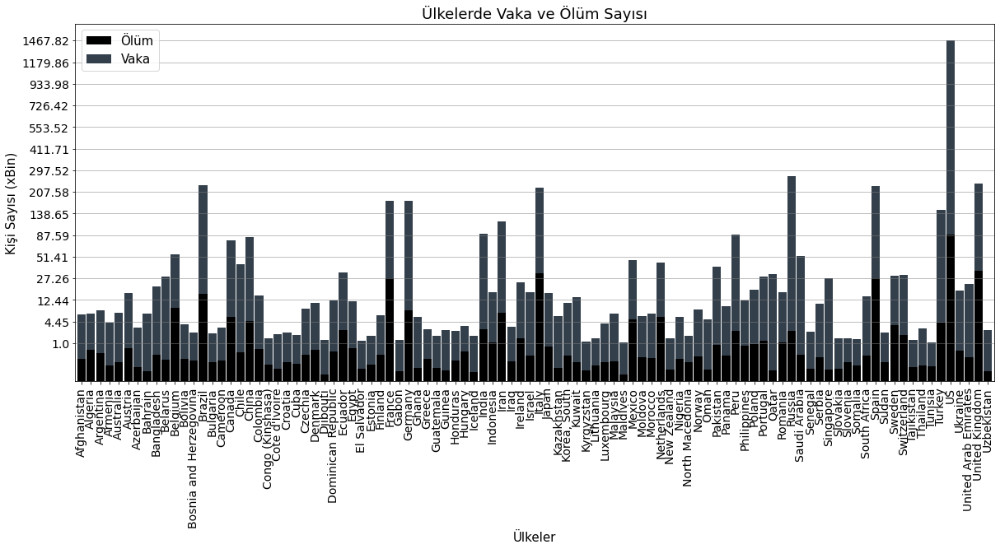

In [0]:
dts = data[(data['Date']==data['Date'].max()) & (data['Confirmed'] > 1000)][['Country/Region', 'Deaths', 'Confirmed']].set_index('Country/Region').sort_index()
ks = 0.3

dts['Deaths'] = dts['Deaths']**ks
dts['Confirmed'] = dts['Confirmed']**ks - dts['Deaths']

dts.plot(kind='bar', width=0.9, figsize=(20,8), stacked=True, color=['#000', '#333F4B'])
plt.yticks(np.linspace(1000**ks, dts[['Confirmed','Deaths']].max().sum(), 15), 
           np.round((np.linspace(1000**ks, ((dts['Confirmed'].max() + dts['Deaths'].max())**(1/ks))**ks, 15)**(1/ks)).astype('int')/1000,2))
plt.xlabel('Ülkeler',fontsize=15)
plt.ylabel('Kişi Sayısı (xBin)', fontsize=15)
plt.title("Ülkelerde Vaka ve Ölüm Sayısı", fontsize=18)
plt.grid(axis='y', color='gray', linestyle='-', linewidth=0.5)
plt.legend(['Ölüm', 'Vaka'], loc='upper left',fontsize=15)


<h2>Koronavirüs Kaynaklı Ölümler</h2>
<p>• Corona virüsler (CoV), hafif düzeyli soğuk algınlığından şiddetli solunum sıkıntısına kadar farklı tablolara neden olan büyük bir virüs ailesidir. Coronavirus’ların insanlarda dolaşımda olan alt tipleri (HCoV-229E, HCoV-OC43, HCoV-NL63 ve HKU1-CoV) çoğunlukla soğuk algınlığına sebep olan virüslerdir.<p/>
<p>• SARS-CoV, 21. yüzyılın ilk uluslararası sağlık acil durumu olarak 2003 yılında, daha önceden bilinmeyen bir virüs halinde ortaya çıkmış olup yüzlerce insanın hayatını kaybetmesine neden olmuştur.</p>
<p>• Yaklaşık 10 yıl sonra Coronavirus ailesinden, daha önce insan ya da hayvanlarda varlığı gösterilmemiş olan MERSCoV (Middle East Respiratory Syndrome Coronavirus) Eylül 2012’de ilk defa insanlarda Suudi Arabistan’da tanımlanmış; ancak daha sonra aslında ilk vakaların Nisan 2012’de Ürdün Zarqa’daki bir hastanede görüldüğü ortaya çıkmıştır. SARS Coronavirus’u ile uzaktan bağlantılı olmasına rağmen, yaşanmış olan SARS tecrübesinden ötürü endişe oluşturmuştur.</p>
<p>• Yaklaşık 10 yıl sonra Coronavirus ailesinden, daha önce insan ya da hayvanlarda varlığı gösterilmemiş olan MERSCoV (Middle East Respiratory Syndrome Coronavirus) Eylül 2012’de ilk defa insanlarda Suudi Arabistan’da tanımlanmış; ancak daha sonra aslında ilk vakaların Nisan 2012’de Ürdün Zarqa’daki bir hastanede görüldüğü ortaya çıkmıştır. SARS Coronavirus’u ile uzaktan bağlantılı olmasına rağmen, yaşanmış olan SARS tecrübesinden ötürü endişe oluşturmuştur.</p>
<p>• Aşağıdaki Dünyadaki Toplam Ölüm Değerleri grafiğinde Covid-19 kaynaklı ölüm eğrisi ve günlük ölüm sayısına ait eğri verilmiştir.</p>

<p><small>Kaynak: <a>https://hisarhospital.com/corona-virusu-kendisi-kucuk-ama-tahribati-buyuk/<a/></small></p>


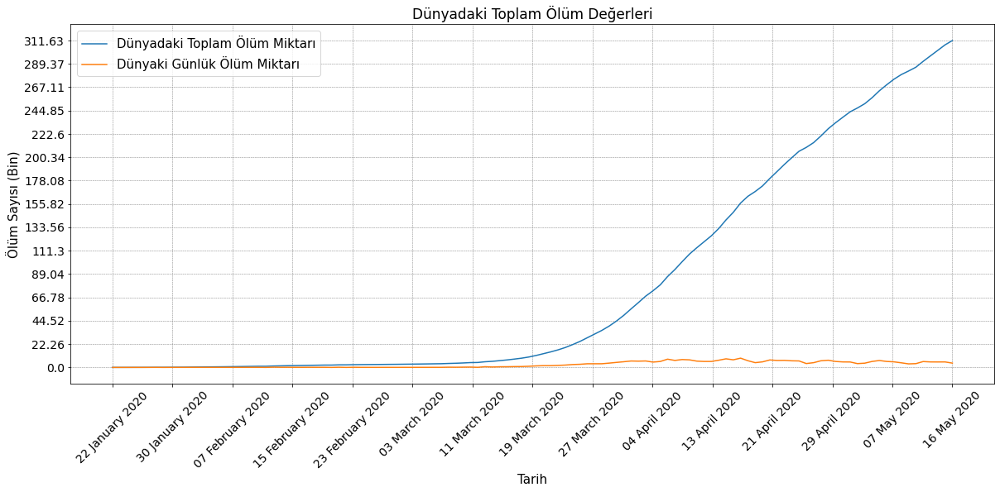

In [0]:
plt.figure(figsize=(20,8))

plt.plot(datatoplam.groupby('Date').sum().index, datatoplam.groupby('Date').sum()['Deaths'], label = "Dünyadaki Toplam Ölüm Miktarı")
plt.plot(datatoplam.groupby('Date').sum().index, artis(datatoplam.groupby('Date').sum()['Deaths'].tolist()), label = "Dünyaki Günlük Ölüm Miktarı")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.linspace(0, max(datatoplam.groupby('Date').sum()['Deaths']), 15),
           np.round(np.linspace(0, max(datatoplam.groupby('Date').sum()['Deaths']), 15)/1000,2))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Ölüm Sayısı (Bin)', fontsize=15)
plt.title('Dünyadaki Toplam Ölüm Değerleri', fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)




<h2>Ülkelerin Ölüm Eğrileri</h2>
<p>• Avrupa devletlerinin ve Amerika Birleşik Devletlerinin geç aldığı önlemler, vatandaşların önlemlere uymaması ve salgını hafife alması vaka sayısının hızla artmasına neden olmuştu. <p/>
<p>• Vakanın hızlı artışı, ölümlerin ani artışını tetiklemişti.</p>
<p>• Devletlerin sağlık sistemlerin ani artan vaka ve ölüm sayısını taşıyamadı ve bu durum zaten hızlı şeklide artan ölüm sayısını daha da hızlandırdı.</p>
<p>• Çin, salgının başından itibaren aldığı önlemelerle ve halkın bu önemlere büyük ölçüde uymasıyla, salgını bastırmayı başardı. </p>
<p>• Aşağıdaki Bazı Ülkelerdeki Ölüm Değerleri grafiğinde ülkelerin ölüm eğrisi verilmiştir. Grafikte Çin ile diğer ülkeler arasındaki ölüm artış hızı açıkça görünüyor.</p>



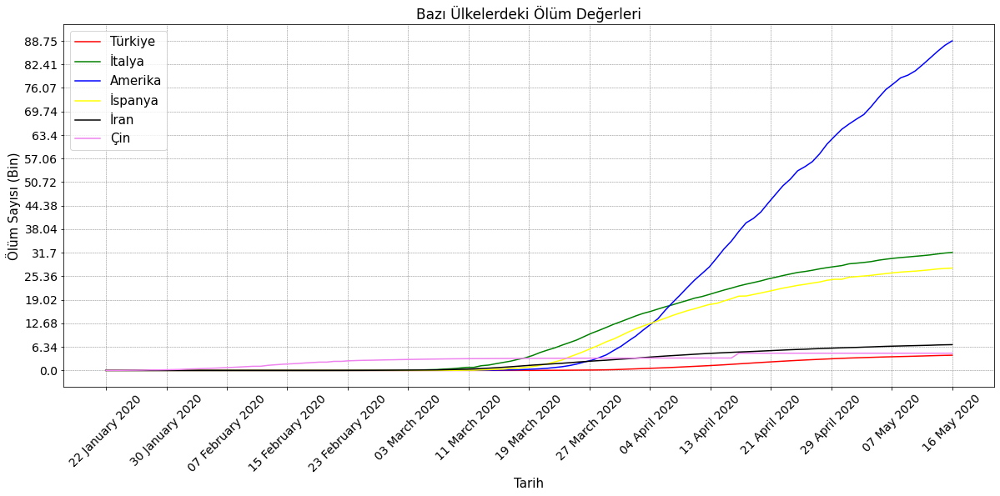

In [0]:
plt.figure(figsize=(20,8))

plt.plot(data[(data['Country/Region'] == 'Turkey')]['Date'], 
         data[(data['Country/Region'] == 'Turkey')]['Deaths'], c='Red', label = "Türkiye")
plt.plot(data[(data['Country/Region'] == 'Italy')]['Date'], 
         data[(data['Country/Region'] == 'Italy')]['Deaths'], c='Green', label = "İtalya")
plt.plot(data[(data['Country/Region'] == 'US')]['Date'], 
         data[(data['Country/Region'] == 'US')]['Deaths'], c='Blue', label = "Amerika")
plt.plot(data[(data['Country/Region'] == 'Spain')]['Date'], 
         data[(data['Country/Region'] == 'Spain')]['Deaths'], c='Yellow', label = "İspanya")
plt.plot(data[(data['Country/Region'] == 'Iran')]['Date'], 
         data[(data['Country/Region'] == 'Iran')]['Deaths'], c='Black', label = "İran")
plt.plot(data[(data['Country/Region'] == 'China')]['Date'], 
         data[(data['Country/Region'] == 'China')]['Deaths'], c='Violet', label = "Çin")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.linspace(0, max(data[(data['Country/Region'] == 'US')]['Deaths']), 15), 
           np.round(np.linspace(0, max(data[(data['Country/Region'] == 'US')]['Deaths']), 15)/1000,2))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Ölüm Sayısı (Bin)', fontsize=15)
plt.title("Bazı Ülkelerdeki Ölüm Değerleri", fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)


<h2>Türkiye'de Koronavirüs Pandemisi</h2>
<p>• Dünya geneline yayılan 2019-20 koronavirüs salgını'nın Türkiye'deki ilk tespit edilen COVID-19 vakası Türkiye Cumhuriyeti Sağlık Bakanlığı tarafından 10 Mart 2020'de açıklandı.<p/>
<p>• Salgın Türkiye'de sosyal, ekonomik, siyasî, iktisadî, idarî, hukukî, askerî ve dinî alanlarda birçok önemli etkilere ve sonuçlara neden olan radikal kararlar alınmasına neden oldu.</p>
<p>• Salgın Türkiye'de sosyal, ekonomik, siyasî, iktisadî, idarî, hukukî, askerî ve dinî alanlarda birçok önemli etkilere ve sonuçlara neden olan radikal kararlar alınmasına neden oldu.</p>
<p>• Ülkede ilk, orta ve liselerde eğitim-öğretim askıya alınırken; bütün üniversitelerde bahar dönemi dersleri iptal edilerek sınavlar ertelendi.</p>
<p>•  Diyanet İşleri Başkanlığı cuma namazı başta olmak üzere cami ve mescitlerde cemaatle namaza ara verildiğini duyurdu.</p>
<p>• Tüm restaurantlar, cafe, müze, dershane, kurs, alışveriş merkezi, kahvehane, spor salonları, konser mekanları, dernek, düğün salonu, piknik ve ören yerleri, park ve bahçeler ziyaretçilere kapatıldı.</p>
<p>• Ülkedeki bütün futbol ligleri ertelendi ve tüm spor müsabakaları bir sonraki açıklamaya kadar iptal edildi</p>
<p>• Koronavirüs salgınının cezaevlerine sıçraması ve oluşabilecek kamu düzeninin bozulması riski nedeniyle bazı suçlarda infaz indirimi öngören ve denetimli serbestlik süresinin geçici olarak 3 yıla çıkarılmasını öngören yasa mecliste kabul edilerek yasalaştı ve 90 bin hükümlüye tahliye yolu açıldı. </p>
<p>• Hükûmet, salgının yayılım hızını düşürmek ve insanlar arasında sosyal mesafeyi korumak için ilk olarak 65 yaş ve üstü kişilere sokağa çıkma yasağı uygulaması başlattı. Daha sonra bu kısıtlamayı 20 yaş ve altı çocuk ve gençleri de kapsayacak şekilde genişletti. </p>
<p>• 11-12 Nisan 2020'de ise, 2000 yılındaki nüfus sayımından 20 yıl sonra ilk kez geniş çaplı bir sokağa çıkma yasağı ilan edildi. İçişleri Bakanlığı Türkiye'nin 30 büyükşehir belediyesi ile akciğer hastalıklarının sık görüldüğü Zonguldak ilinde haftasonu iki gün boyunca sokağa çıkma yasağı ilan edildi. Sokağa çıkmağa yasağı ilerleyen zamanlarda tekrarlandı.</p>
<p>• Aşağıdaki Türkiye'de Covid-19 Eğrileri grafiğinde Covid-19 vaka, ölüm ve iyileşme eğrileri bulunmaktadır.</p>



<p><small>Kaynak: <a>https://tr.wikipedia.org/wiki/T%C3%BCrkiye%27de_2020_koronavir%C3%BCs_pandemisi<a/></small></p>


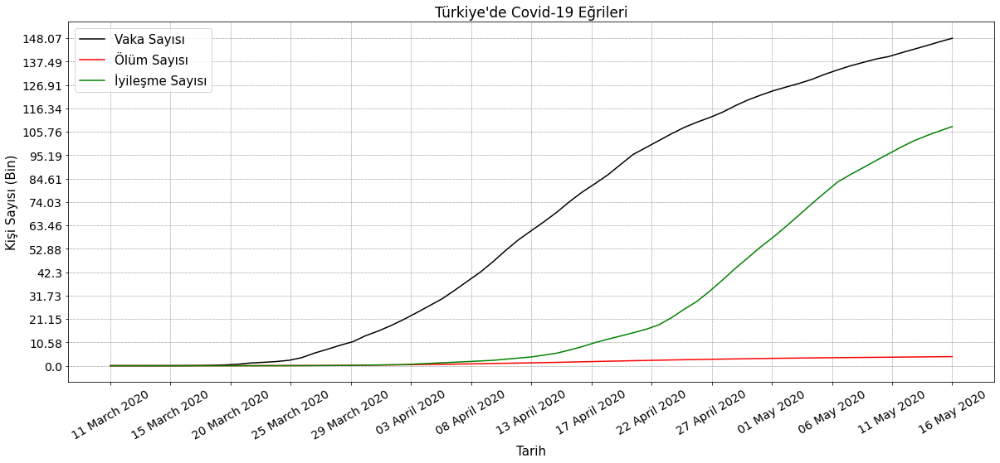

In [0]:
plt.figure(figsize=(20,8))

d = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]

plt.plot(d['Date'], d['Confirmed'], c='Black', label = "Vaka Sayısı")
plt.plot(d['Date'],  d['Deaths'], c='Red', label = "Ölüm Sayısı")
plt.plot(d['Date'], d['Recovered'], c='Green', label = "İyileşme Sayısı")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks((np.linspace(0, max(data[(data['Country/Region'] == 'Turkey') & (data['Deaths'] != 0)]['Confirmed']), 15)),
           np.round((np.linspace(0, max(data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Confirmed']), 15)/1000),2))
plt.xticks(np.linspace(d['Date'].min().value, d['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(d['Date'].min().value, d['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=30)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Kişi Sayısı (Bin)', fontsize=15)
plt.title("Türkiye'de Covid-19 Eğrileri", fontsize=17)
plt.grid(linestyle='dashed' ,color='gray',linewidth=0.5)
plt.legend(fontsize=15)


No handles with labels found to put in legend.


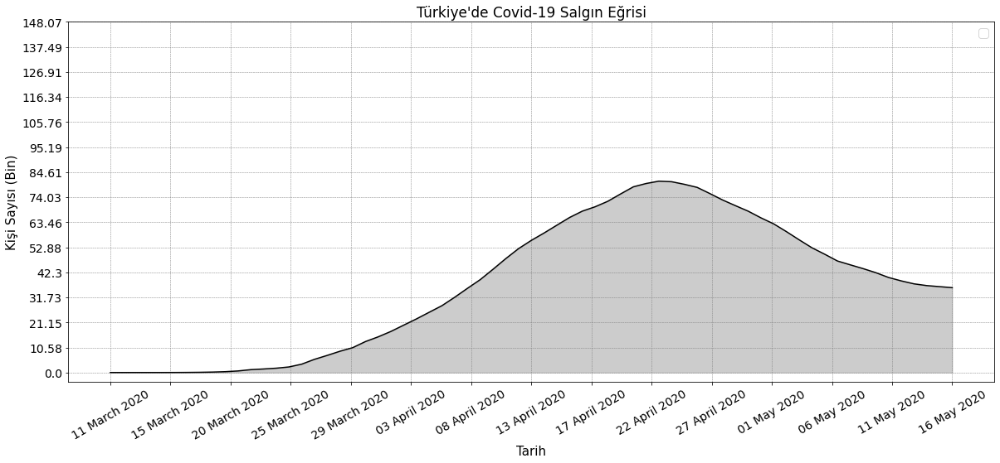

In [0]:
plt.figure(figsize=(20,8))

olum = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Deaths']
iyilesme = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Recovered']
vaka = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Confirmed'] -(olum+iyilesme)

plt.plot( data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'], vaka, color="black", alpha=1)
plt.fill_between( data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'], vaka, color="gray", alpha=0.4)
plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks((np.linspace(0, max(data[(data['Country/Region'] == 'Turkey') & (data['Deaths'] != 0)]['Confirmed']), 15)),
           np.round((np.linspace(0, max(data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Confirmed']), 15)/1000),2))
plt.xticks(np.linspace(data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'].min().value,
                       data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'].min().value, 
                                                  data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=30)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Kişi Sayısı (Bin)', fontsize=15)
plt.title("Türkiye'de Covid-19 Salgın Eğrisi", fontsize=17)
plt.grid(linestyle='dashed' ,color='gray',linewidth=0.5)
plt.legend(fontsize=15)

<h2>Türkiye'de Koronavirüs Pandemisi</h2>
<p>• Sağlık Bakanı Fahrettin Koca, 1 Nisan 2020'de yaptığı açıklamada koronavirüs vakalarının tüm Türkiye'ye yayıldığını açıkladı.</p>
<p>• 19 Nisan itibariyle Türkiye vaka sayısında, salgının ilk başladığı ülke olan Çin'i geride bıraktı.<p/>
<p>• 10 Nisan'da paylaşılan verilere göre 28 bin vaka ile İstanbul en çok vakanın olduğu şehir olurken, onu sırasıyla İzmir, Ankara, Kocaeli ve Konya takip etti.<p/>
<p>• Dışişleri Bakanı Mevlüt Çavuşoğlu 18 Nisan'da yaptığı açıklamada yurt dışında koronavirüsten 342 Türk vatandaşının hayatını kaybettiğini açıkladı.<p/>

<p><small>Kaynak: <a>https://tr.wikipedia.org/wiki/T%C3%BCrkiye%27de_2020_koronavir%C3%BCs_pandemisi<a/></small></p>


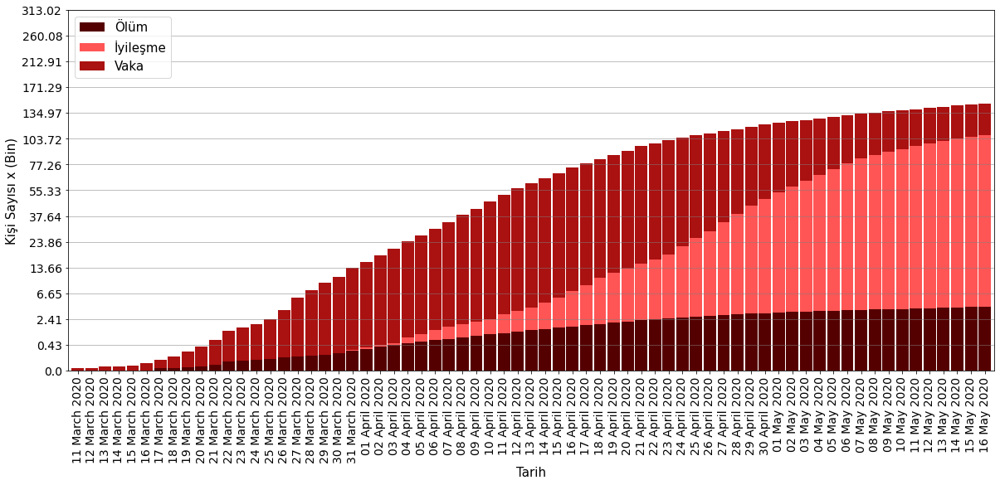

In [0]:
dts = data[(data['Confirmed'] > 0) & (data['Country/Region'] == 'Turkey')][['Date', 'Deaths','Recovered' ,'Confirmed']].set_index('Date').sort_index()
ks = 0.4

dts['Deaths'] = dts['Deaths']**ks
dts['Recovered'] = dts['Recovered']**ks - dts['Deaths']
dts.loc[dts['Recovered'] < 0, 'Recovered'] = 0
dts['Confirmed'] = dts['Confirmed']**ks - (dts['Recovered'] + dts['Deaths'])

dts.index = pd.to_datetime(dts.index).strftime('%d %B %Y')

dts.plot(kind='bar', width=0.90, figsize=(20,8), stacked=True, color=['#500', '#F55', '#A11'])

plt.yticks(np.linspace(0, dts[['Confirmed', 'Recovered', 'Deaths']].max().sum(), 15), 
           np.round((np.linspace(0, ((dts['Confirmed'].max()+ dts['Recovered'].max() + dts['Deaths'].max())**(1/ks))**ks, 15)**(1/ks)).astype('int')/1000,2))
plt.xlabel('Tarih',fontsize=15)
plt.ylabel('Kişi Sayısı x (Bin)', fontsize=15)
plt.title("", fontsize=18)
plt.grid(axis='y', color='gray', linestyle='-', linewidth=0.5)
plt.legend(['Ölüm', 'İyileşme', 'Vaka'], loc='upper left',fontsize=15)


<h2>Koronavirüs nasıl tedavi edilir?</h2>
<p>• DSÖ verilerine göre yeni tip koronavirüse yakalananların yüzde 80'i, hatta yüzde 85'i özel bir tedaviye ihtiyaç duymaksızın hastalığı atlatabiliyor.</p>
<p>• Coronavirüs bir bakteri olmadığı için antibiyotikler işe yaramaz. Şu anda coronavirüse özgü bir tedavi yoktur. Coronavirüs tedavisi ve coronavirüs aşısı geliştirme çalışmaları sürmektedir.</p>
<p>• Sıtma tedavisinde kullanılan klorokin Şubat 2020'de Çin'de tedavi için araştırılmış, öncül sonuçlar maddeyi etkin göstermiştir.<p/>
<p>• Klorokin ve hidroksiklorokin, ikinci madde daha güçlü ve güvenli olacak şekilde SARS-CoV-2'yi in vitro inhibe etmektedir.<p/>
<p>• COVID-19'un çoğu vakası solunum cihazıyla gerçekleştirilebilecek mekanik ventilasyon (makine yoluyla solunum desteği) gerektirmese de vakaların belli bir yüzdesinde bu gerekmektedir.<p/>
<p>• Aşağıdaki Türkiyede Ölüm ve İyileşme Eğrileri grafiğinde Türiye'deki iyileşme ve ölüm eğrileri bulunmaktadır.<p/>



<p><small>Kaynak: <a>https://www.medicalpark.com.tr/coronavirus/hg-2287</a></small></p>
<p><small>Kaynak2: <a>https://tr.wikipedia.org/wiki/Koronavir%C3%BCs_hastal%C4%B1%C4%9F%C4%B1_2019#Tedavi</a></small></p>
<p><small>Kaynak3: <a>https://t24.com.tr/haber/20-soruda-yeni-tip-koronavirus-covid-19-hakkinda-her-sey,868277</a></small></p>


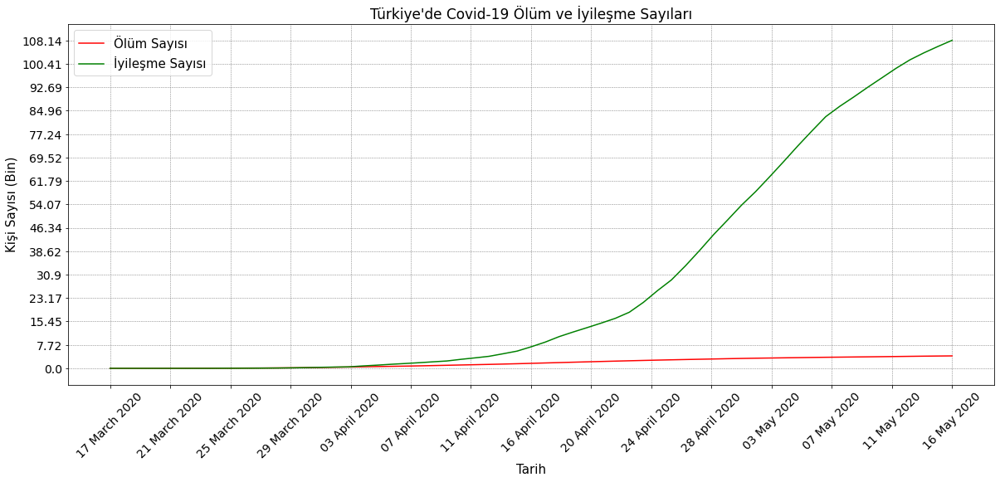

In [0]:
plt.figure(figsize=(20,8))
d = data[(data['Country/Region'] == 'Turkey') & (data['Deaths'] > 0)]
plt.plot(d['Date'], d['Deaths'], c='Red', label = "Ölüm Sayısı")
plt.plot(d['Date'], d['Recovered'], c='Green', label = "İyileşme Sayısı")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks((np.linspace(0, max(d['Recovered']), 15)), np.round((np.linspace(0, max(d['Recovered']), 15)/1000),2))
plt.xticks(np.linspace(d['Date'].min().value,d['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(d['Date'].min().value, d['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Kişi Sayısı (Bin)', fontsize=15)
plt.title("Türkiye'de Covid-19 Ölüm ve İyileşme Sayıları", fontsize=17) 

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)


<h2>Günlük Vaka Artışı</h2>
<p>• Günlük vaka artışı salgının ilerleyişi açısından önemlidir.</p>
<p>• Plato dönemi vaka artış ve ölüm artış hızının duraklamaya girdiği, stabilleşmenin başladığı dönemdir.</p>
<p>• Hastalığın en üst sınırı yani zirve noktasını görmesi pik noktası olarak adlandırılıyor.</p>
<p>• Aşağıdaki Bazı Ülkelerde Günlük Vaka Artışı grafiğinde ülkelerin günlük vaka artışını görebiliriz. Günlük vaka artışının genel olarak düşmeye başladığı görünüyor.<p/>


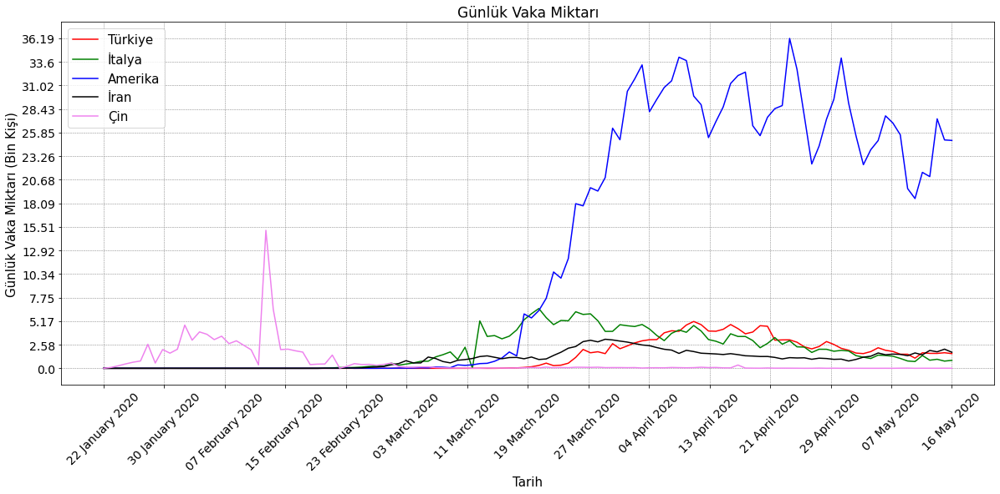

In [0]:
d = data[(data['Country/Region'] == 'US')]

plt.figure(figsize=(20,8))
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Turkey')]['Confirmed'].tolist()), c='Red', label = "Türkiye")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Italy')]['Confirmed'].tolist()), c='Green', label = "İtalya")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'US')]['Confirmed'].tolist()), c='Blue', label = "Amerika")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Iran')]['Confirmed'].tolist()), c='Black', label = "İran")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'China')]['Confirmed'].tolist()), c='Violet', label = "Çin")

plt.yticks((np.linspace(0, max(artis(d['Confirmed'].tolist())), 15)), np.round((np.linspace(0, max(artis(d['Confirmed'].tolist())), 15)/1000),2))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Günlük Vaka Miktarı (Bin Kişi)', fontsize=15)
plt.title('Günlük Vaka Miktarı', fontsize=17)
plt.grid(color='gray', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=15)



In [0]:
gv = list()
for i, row in data[(data['Confirmed'] > 20000) & (data['Date'] == data['Date'].max())].iterrows():
  gv.append([row['Country/Region'],artis(data[data['Country/Region'] == row['Country/Region']]['Confirmed'].tolist())])

<h2>Türkiye'de Günlük Vaka Artışı</h2>
<p>• Vaka sayısı ilk vakadan bu yana hızlı bir artış göstermişti.</p>
<p>• Vaka sayısı artmaya devam ediyor fakat son günlerde vaka artış hızında bir düşüş var.</p>
<p>• Aşağıdaki Türkiye'deki Günlük Vaka Artışı grafiğinde günlük vaka artışını inceleyebiliyoruz. Eğer günlük vaka artışı 5 bin miktarına tekrar ulaşmaz ise peak noktasına ulaşılmış diyebiliriz.<p/>


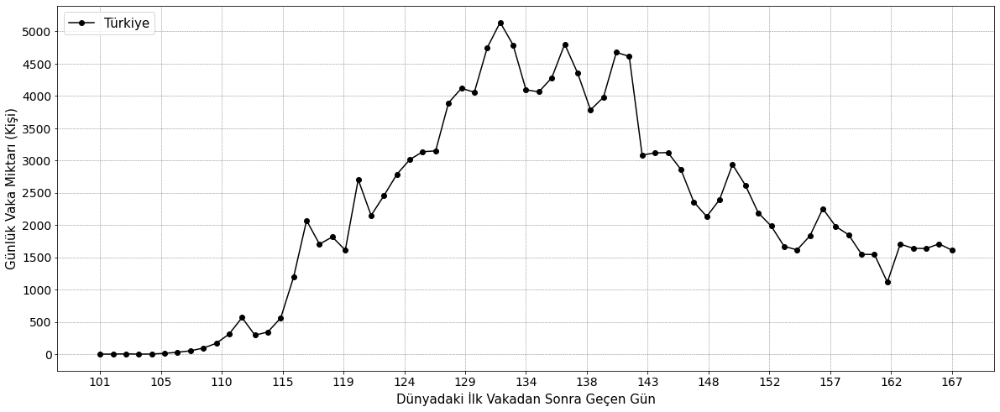

In [0]:
d = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] != 0)]
dg = df[(df['Country/Region'] == 'Turkey') & (df['Confirmed'] != 0)]
plt.figure(figsize=(20,8))
plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.arange(0, max(artis(d['Confirmed'].tolist()))+500, 500))
plt.xticks(np.linspace(d['Date'].min().value, d['Date'].max().value, 15).astype('datetime64[ns]'), np.linspace(dg['Date'].min(), dg['Date'].max(), 15).astype('int'))
plt.plot(d['Date'], artis(d['Confirmed'].tolist()), marker='o', c='black', label = "Türkiye")
plt.xlabel('Dünyadaki İlk Vakadan Sonra Geçen Gün', fontsize=15)
plt.ylabel('Günlük Vaka Miktarı (Kişi)', fontsize=15)
plt.title("", fontsize=17)
plt.grid(color='gray', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=15, loc=2)


<h2>Günlük Ölüm Artışı</h2>
<p>• Günlük vaka sayısındaki gibi günlük ölüm sayısında da genel olarak bir düşüş görünüyor.</p>
<p>• Covid-19 için spesifik bir tedavi olmasa da hangi tedavilerin daha etkili olduğunun öğrenilmesi tedavilerin sonuç vermesinde etkili oldu.</p>
<p>• Aşağıdaki Bazı Ülkelerde Günlük Vaka Artışı grafiğinde ülkelerin günlük ölüm sayısını görebiliriz. Önlemlerin devam etmesiyle, günlük vaka ve ölüm sayısının düşmeye devam edecek gibi görünüyor.<p/>


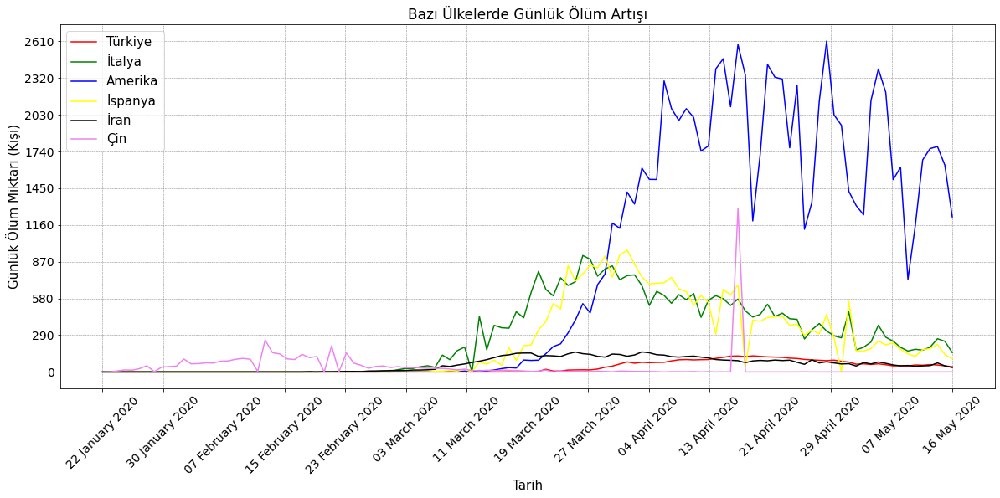

In [0]:
d = data[(data['Country/Region'] == 'China')]

plt.figure(figsize=(20,8))

plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Turkey')]['Deaths'].tolist()), c='Red', label = "Türkiye")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Italy')]['Deaths'].tolist()), c='Green', label = "İtalya")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'US')]['Deaths'].tolist()), c='Blue', label = "Amerika")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Spain')]['Deaths'].tolist()), c='Yellow', label = "İspanya")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'Iran')]['Deaths'].tolist()), c='Black', label = "İran")
plt.plot(d['Date'], artis(data[(data['Country/Region'] == 'China')]['Deaths'].tolist()), c='Violet', label = "Çin")
plt.yticks((np.linspace(0, max(artis(data[(data['Country/Region'] == 'US')]['Deaths'].tolist())), 10).astype('int')//10)*10)
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Günlük Ölüm Miktarı (Kişi)', fontsize=15)
plt.title('Bazı Ülkelerde Günlük Ölüm Artışı', fontsize=17)
plt.grid(color='gray', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=15)


<h2>Türkiye'de Günlük Ölüm Artışı</h2>
<p>• İlk vakadan kısa bir süre sonra ölümler başlamıştı.</p>
<p>• Günlük ölüm sayısı, günlük vaka sayısı gibi son günlerde düşüşte görünüyor.</p>
<p>• Bu düşüşleri uygulanan karantinaların ve tecrübe edilen tedavilerin bir sonucu olarak görebiliriz.</p>
<p>• Aşağıdaki Türkiye'deki Günlük Ölüm Artışı grafiğinde günlük ölüm artışını görebiliyoruz. Günlük ölümün tekrar yükselişe geçmeyeceğini varsayarsak peak noktasına ulaşmış diyebiliriz.<p/>



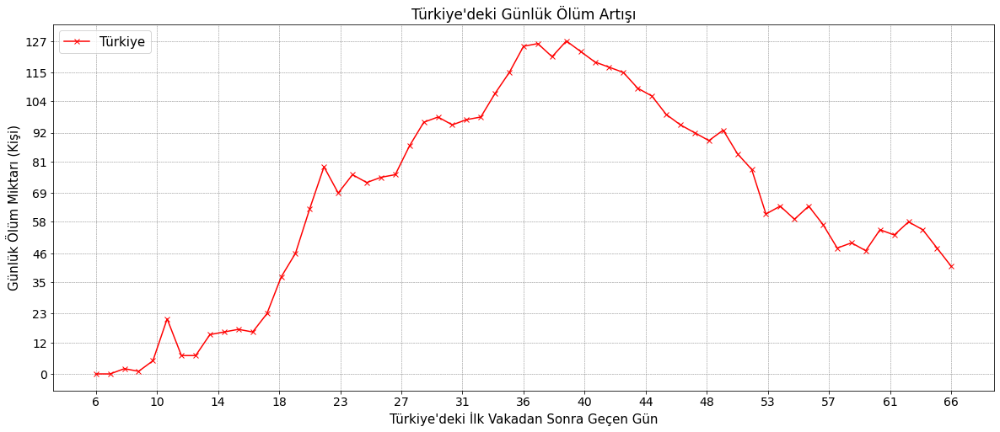

In [0]:
d = data[(data['Country/Region'] == 'Turkey') & (data['Deaths'] > 0)]
dg = df[(df['Country/Region'] == 'Turkey') & (df['Deaths'] > 0)]
ilk_vaka = df[(df['Country/Region'] == 'Turkey') & (df['Confirmed'] != 0)]['Date'].min()

plt.figure(figsize=(20,8))
plt.plot(d['Date'], artis(d['Deaths'].tolist()), marker='x', c='Red', label = "Türkiye")

plt.rc(['xtick','ytick'], labelsize=14)
plt.yticks(np.round(np.linspace(0, max(artis(d['Deaths'].tolist())), 12)))
plt.xticks(np.linspace(d['Date'].min().value, d['Date'].max().value, 15).astype('datetime64[ns]'), 
           np.linspace(dg['Date'].min()-ilk_vaka, dg['Date'].max()-ilk_vaka, 15).astype('int'))

plt.xlabel("Türkiye'deki İlk Vakadan Sonra Geçen Gün", fontsize=15)
plt.ylabel('Günlük Ölüm Miktarı (Kişi)', fontsize=15)
plt.title("Türkiye'deki Günlük Ölüm Artışı", fontsize=17)
plt.grid(color='gray', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=15, loc=2)


In [0]:
data_test = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv')
data_test['date'] = pd.to_datetime(data_test['date'])
data_test = data_test[['location', 'date', 'total_tests']]
data_test.dropna(inplace=True)
data_test.columns = ['Entity', 'Date', 'Total tests']

<h2>Covid-19 Testi</h2>
<p>• Dünya Sağlık Örgütü, hastalığın tanısı için çeşitli test protokolleri açıklamıştır.</p>
<p>• Standart test yöntemi, gerçek zamanlı revers transkriptaz polimeraz zincir reaksiyonu (rRT-PCR) olmaktadır. Bu test, kişiden alınacak nazofarengeal sürüntü veya balgam gibi solunum yollarından alınmış örnekler ile gerçekleştirilebilmektedir.</p>
<p>• PCR testleri, doğruluk oranının yüksekliği nedeniyle altın standarttır fakat test sonucu almanın yavaş olması (en az 4 ila 6 saat), deneyimli personel ihtiyacı ve lojistik olarak merkezî bir konumda yapılması gereksinimi yönünden testin yapılması zordur.<p/>
<p>• 23 Mart 2020 itibarıyla, SARS-CoV-2'ye karşı üretilen IgM ve IgG antikorlarını tespit edebilen, 15 dakikada sonuç veren testler üretilmiş, Çin'de onaylanmasının yanı sıra Avrupa'da CE işareti almıştır.<p/>
<p>• Bu testlerin doğruluk oranı PCR'a göre daha düşüktür, örneğin testlerden biri için %13'lük bir yanlış negatif (hastalığa sahip olmakla beraber negatif sonuç) oranı verilmektedir.<p/>
<p>• Aşağıdaki Bazı Ülkelerdeki Test Sayıları grafiğinde test sayılarının eğrisi bulunmaktadır.<p/>



<p><small>Kaynak: <a>https://tr.wikipedia.org/wiki/Koronavir%C3%BCs_hastal%C4%B1%C4%9F%C4%B1_2019#Tan%C4%B1</a></small></p>

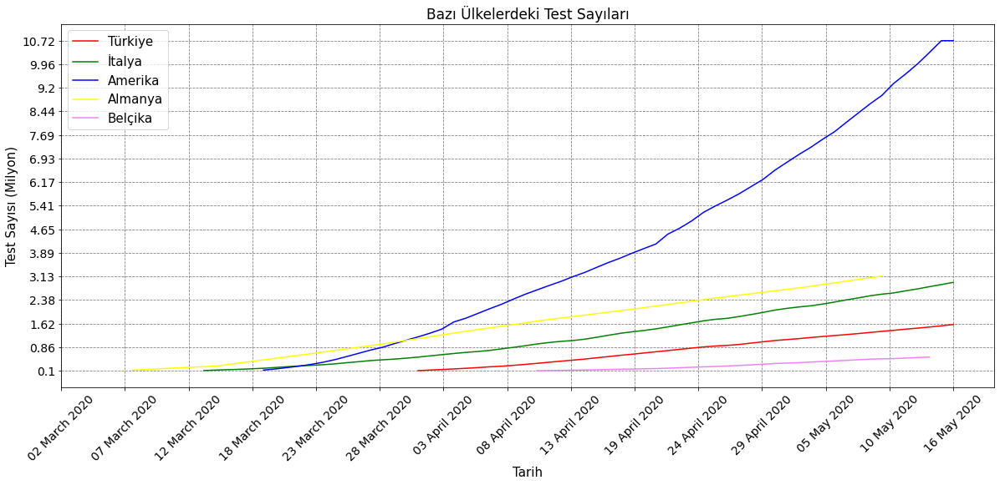

In [0]:
plt.figure(figsize=(20,8))
test_limit = 100000

plt.plot(data_test[(data_test['Entity'] == 'Turkey') & (data_test['Total tests'] > test_limit)]['Date'], 
         data_test[(data_test['Entity'] == 'Turkey') & (data_test['Total tests'] > test_limit)]['Total tests'], c='Red', label = "Türkiye")
plt.plot(data_test[(data_test['Entity'] == 'Italy') & (data_test['Total tests'] > test_limit)]['Date'], 
         data_test[(data_test['Entity'] == 'Italy') & (data_test['Total tests'] > test_limit)]['Total tests'], c='Green', label = "İtalya")
plt.plot(data_test[(data_test['Entity'] == 'United States') & (data_test['Total tests'] > test_limit)]['Date'], 
         data_test[(data_test['Entity'] == 'United States') & (data_test['Total tests'] > test_limit)]['Total tests'], c='Blue', label = "Amerika")
plt.plot(data_test[(data_test['Entity'] == 'Germany') ]['Date'], 
         data_test[(data_test['Entity'] == 'Germany') & (data_test['Total tests'] > test_limit)]['Total tests'], c='Yellow', label = "Almanya")
plt.plot(data_test[(data_test['Entity'] == 'Belgium') & (data_test['Total tests'] > test_limit)]['Date'], 
         data_test[(data_test['Entity'] == 'Belgium') & (data_test['Total tests'] > test_limit)]['Total tests'], c='Violet', label = "Belçika")

plt.yticks(np.linspace(test_limit, data_test['Total tests'].max(), 15),
           np.round(np.linspace(test_limit, data_test['Total tests'].max(),15)/1000000, 2))
plt.xticks(np.linspace(data_test[(data_test['Total tests'] > test_limit)]['Date'].min().value, 
                       data_test[(data_test['Total tests'] > test_limit)]['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data_test[(data_test['Total tests'] > test_limit)]['Date'].min().value, 
                       data_test[(data_test['Total tests'] > test_limit)]['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Test Sayısı (Milyon)', fontsize=15)
plt.title("Bazı Ülkelerdeki Test Sayıları", fontsize=17)
plt.grid( color='gray', linestyle='dashed', linewidth=0.8)
plt.legend(fontsize=15)

<h2>Covid-19 Ölüm Oranı</h2>
<p>• Dünya Sağlık Örgütü, hastalığın tanısı için çeşitli test protokolleri açıklamıştır.</p>
<p>• Farklı ülkelerdeki ölüm oranları karşılaştırıldığında ortaya çok değişken bir tablo çıkıyor.</p>
<p>• Dünya Sağlık Örgütü'ne (DSÖ) göre bu farkın altında yatan başlıca nedenler ülkelerin demografik yapısı, tıbbi olanakları ve yapılan test sayısı.<p/>
<p>• Örneğin, İtalya'da hafif semptomlara sahip vakaların Almanya'ya oranla çok daha az test edilmesi ve bu nedenle istatistiklerde yer almaması. Bu durum sadece ağır hastaların tespitine ve dolayısıyla ölüm oranının yükselmesine neden oluyor.<p/>
<p>• Aşağıdaki Bazı Ülkelerdeki Ölüm Oranı grafiğinde ölüm oranlarının eğrisi bulunmaktadır. Türkiye'de test sayısının yüksek olması, ülke nufüsunun genç olması ve sağlık sisteminin mevcut durumu kaldırabilmesi Türkiye'deki ölüm oranının düşük olmasını sağlamıştır.<p/>



<p><small>Referans: <a>https://www.dw.com/tr/koronavir%C3%BCs-%C3%BClkelerde-%C3%B6l%C3%BCm-oranlar%C4%B1-neden-bu-kadar-farkl%C4%B1/a-52939908</a></small></p>

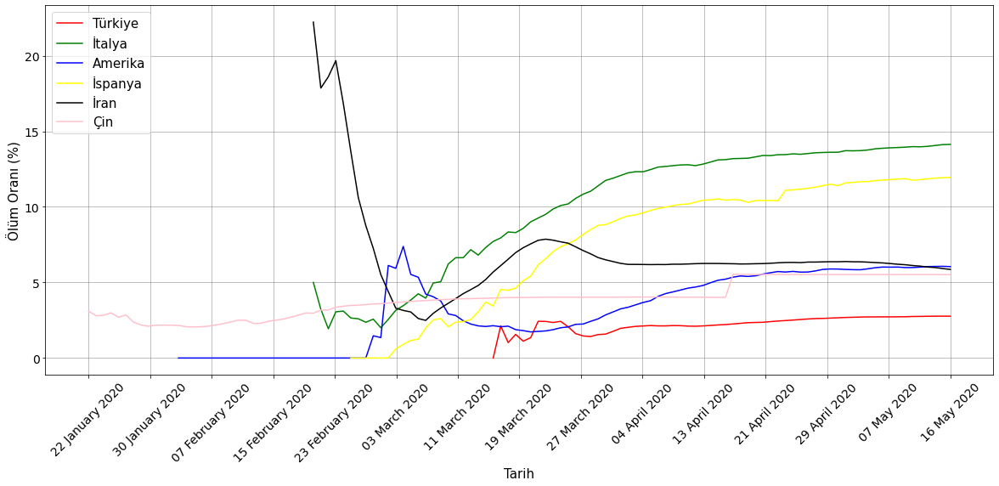

In [0]:
plt.figure(figsize=(20,8))

vaka_limiti = 10

d = data[(data['Country/Region'] == 'Turkey') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='red', label='Türkiye')

d = data[(data['Country/Region'] == 'Italy') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='Green', label='İtalya')

d = data[(data['Country/Region'] == 'US') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='Blue', label='Amerika')

d = data[(data['Country/Region'] == 'Spain') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='Yellow', label='İspanya')

d = data[(data['Country/Region'] == 'Iran') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='Black', label='İran')

d = data[(data['Country/Region'] == 'China') & (data['Confirmed'] >= vaka_limiti)]
plt.plot(d['Date'], 100*d['Deaths']/d['Confirmed'], c='Pink', label='Çin')

plt.rc(['xtick','ytick'], labelsize=14)
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Ölüm Oranı (%)', fontsize=15)
plt.title('', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.legend(fontsize=15, loc=2)


<h2>Covid-19 Ölüm Oranı</h2>
<p>• Dünyadaki ölüm oranı pasta grafiği olarak aşağıda görünüyor.</p>
<p>• Yapılan bir araştırmaya göre corona virüs ölüm oranı, hafif veya asemptomatik vakalar da dahil edilince daha önceki tahminlerden daha düşük seviyeye geriliyor.</p>


<p><small>Kaynak: <a>https://www.ntv.com.tr/galeri/teknoloji/bilim-insanlarindan-yeni-iddia-corona-virusun-olum-orani-daha-dusuk,8C_wBSzsH0uXDNgJ4jmYbA/Wb9LIpJW5kqF_VXlfc82dA</a></small></p>

Text(0.5, 1.0, '')

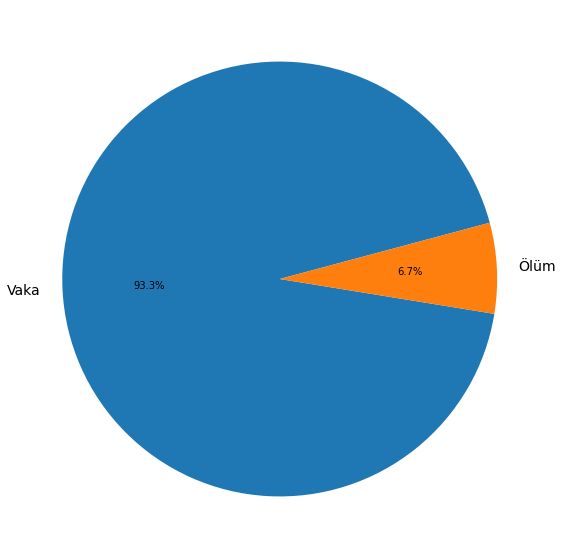

In [0]:
plt.figure(figsize=(10,10))
plt.rc(['xtick','ytick'], labelsize=14)
d = datatoplam.groupby('Date').sum()[-1:]
plt.pie([d['Confirmed'][0]-d['Deaths'][0],d['Deaths'][0]], labels=['Vaka','Ölüm'], autopct='%1.1f%%', startangle=15)
plt.title('', fontsize=15)


In [0]:
salgınlar = {'MERS-CoV (11.12.2017-Birleşik Arap Emirlikleri)':35,'Sarı Humma (Aralık 2017-Nijerya)':21.1, 
                  'Difteri (Ağustos/Aralık 2017-Yemen ve Bangladeş)': 10.5, 'Kolera (Ocak/Kasım 2017-Kenya)':1.9,
                  'Margburg Humması (Uganda ve Kenya)':50, 'Deng Ateşi (28.09.2017- Burkina Faso) ': 0.2}
"""Kaynak: http://dergipark.org.tr/tr/download/article-file/546064"""

'Kaynak: http://dergipark.org.tr/tr/download/article-file/546064'

<h2>Salgınların Ölüm Oranı</h2>
<p>• Geçmişteki salgınlara baktığımızda, bugünkü yaşadığımız salgının öldürücülüğünün düşük olduğunu görebiliriz fakat koranavirüs salgını çok büyük kitlelere ulaşmayı başardı.</p>
<p>• Aşağıda bazı salgınların ölüm oranları görünüyor. Başlıklarındaki tarih ve konumlar salgının son gorüldüğü tarih ve yerdir.</p>


<p><small>Kaynak: <a>https://www.ntv.com.tr/galeri/teknoloji/bilim-insanlarindan-yeni-iddia-corona-virusun-olum-orani-daha-dusuk,8C_wBSzsH0uXDNgJ4jmYbA/Wb9LIpJW5kqF_VXlfc82dA</a></small></p>

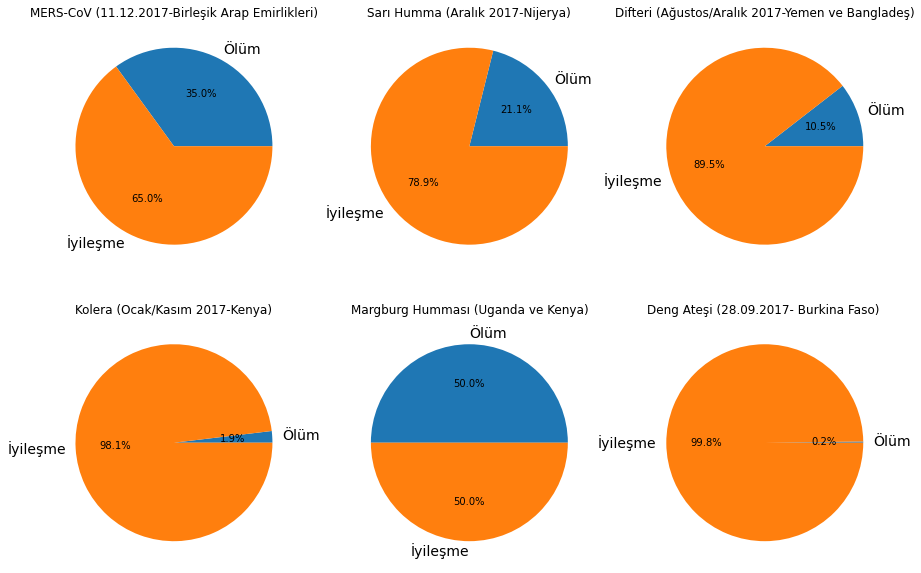

In [0]:
fig, axes= plt.subplots(2,3, figsize=(15,10))
for i, ax in enumerate(axes.flatten()):
  veri_isim = list(salgınlar.keys())
  veri_oran = list(salgınlar.values())
  ax.pie([veri_oran[i],100-veri_oran[i]], autopct="%.1f%%", labels=['Ölüm', 'İyileşme'])
  ax.set_title(veri_isim[i])
plt.show()

Text(0.5, 1.0, "Türkiye'deki yoğun bakım yatak sayıları ")

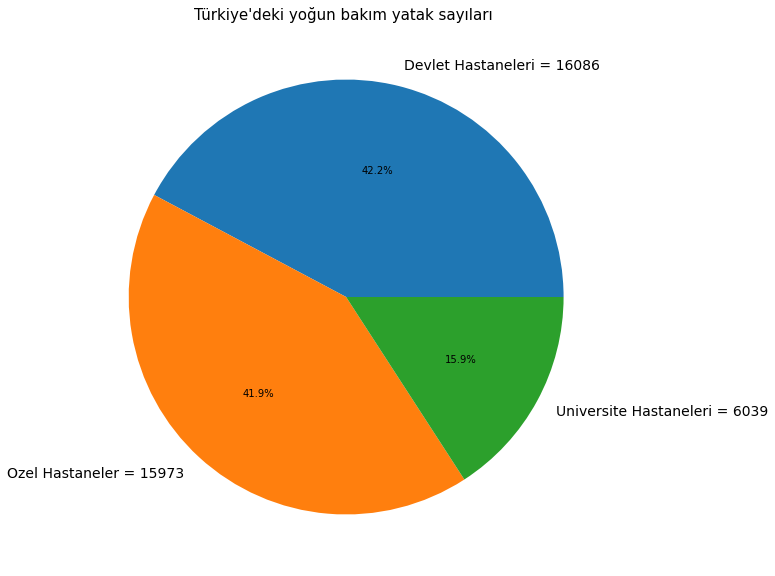

In [0]:
plt.figure(figsize=(10,10))
plt.rc(['xtick','ytick'], labelsize=14)
plt.pie([16086,15973,6039],labels=['Devlet Hastaneleri = 16086','Ozel Hastaneler = 15973','Universite Hastaneleri = 6039'], autopct='%1.1f%%')
plt.title("Türkiye'deki yoğun bakım yatak sayıları ", fontsize=15) #https://mail.google.com/mail/u/0/#inbox/FMfcgxwHMsSvDmDkknMWXTRDBNJCHNNv


<h2>Salgın ve Ekonomi</h2>
<p>• Tüm dünyada milyonlarca kişinin hastalanmasına neden olan koronavirüs, ekonomide de büyük hasarlara yol açtı.</p>
<p>• Birçok ekonomik faaliyete ara verilmek zorunda kalındı.</p>
<p>• Petrol'den Dolar'a birçok ekonomik yapı hasara uğradı. Amerika Merkez Bankası bu dönemde karşılıksız para dahi bastı piyasayı canlı tutmak için. Kısa vadede yangını durdurmak için etkili olsa da uzun vadede Dolar'ın büyük darbeler alacağını öngörebiliriz. </p>
<p>• Türkiye'de Dolar'ın yükselmesinin sebeplerinden bir tanesi de ülkeye para girdi çıktısı olmaması ve Türk Lirası'nın Dolar karşısında da değer kaybetmesinde yol açtı
<p>• Büyük Türk şirketlerinin başta THY olmak üzere ekonomik çıkmaza girebileceği hatta bazı şirketleri iflasa kadar sürükleyebileceği ihtimali doğuyor
<p>• Küçük esnafların, günlük işlerde çalışan insanların aile içi ekonomilerine büyük etkilerde bulunabileceği hatta koronavirüs sonrası işsizlik oranında çok büyük artışlar gözlemlenebileceği öngörülebilir.




In [0]:
data_doviz = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/USD_TRY%20Ge%C3%A7mi%C5%9F%20Verileri%20(6).csv')

In [0]:
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','.').astype('float32')

data_doviz['Şimdi'] = to_float(data_doviz, 'Şimdi')
data_doviz['Açılış'] = to_float(data_doviz, 'Açılış')
data_doviz['Yüksek'] = to_float(data_doviz, 'Yüksek')
data_doviz['Düşük'] = to_float(data_doviz, 'Düşük')
data_doviz['Fark %'] = to_float(data_doviz, 'Fark %')
data_doviz['Tarih'] = data_doviz['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
data_doviz['Tarih'] = pd.to_datetime(data_doviz['Tarih'])

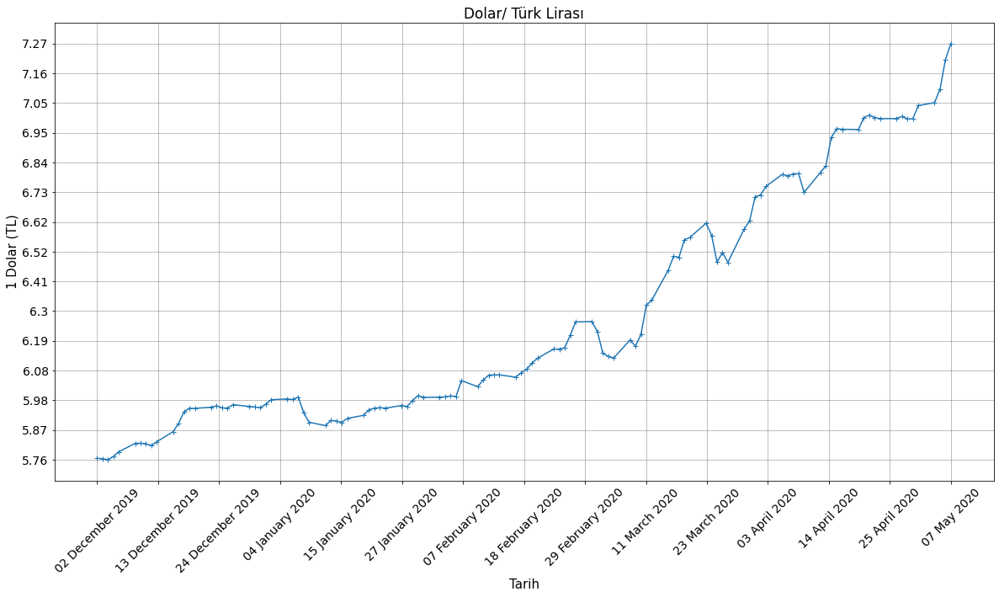

In [0]:
plt.figure(figsize=(20,10))
plt.plot(data_doviz['Tarih'],data_doviz['Yüksek'], marker='+')

plt.yticks(np.linspace(min(data_doviz['Yüksek']), max(data_doviz['Yüksek']), 15), np.round(np.linspace(min(data_doviz['Yüksek']), max(data_doviz['Yüksek']),15),2))
plt.xticks(np.linspace(data_doviz['Tarih'].min().value, 
                       data_doviz['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data_doviz['Tarih'].min().value, 
                       data_doviz['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('1 Dolar (TL)', fontsize=15)
plt.title('Dolar/ Türk Lirası', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

In [0]:
data_doviz = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/EUR_TRY%20Ge%C3%A7mi%C5%9F%20Verileri.csv')

In [0]:
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','.').astype('float32')

data_doviz['Şimdi'] = to_float(data_doviz, 'Şimdi')
data_doviz['Açılış'] = to_float(data_doviz, 'Açılış')
data_doviz['Yüksek'] = to_float(data_doviz, 'Yüksek')
data_doviz['Düşük'] = to_float(data_doviz, 'Düşük')
data_doviz['Fark %'] = to_float(data_doviz, 'Fark %')
data_doviz['Tarih'] = data_doviz['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
data_doviz['Tarih'] = pd.to_datetime(data_doviz['Tarih'])

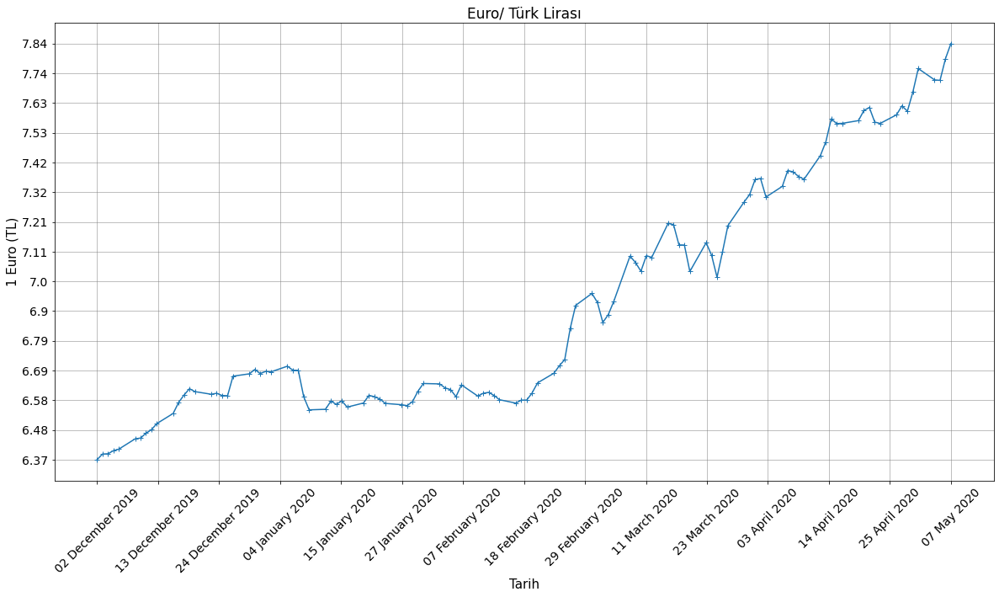

In [0]:
plt.figure(figsize=(20,10))
plt.plot(data_doviz['Tarih'],data_doviz['Yüksek'], marker='+')

plt.yticks(np.linspace(min(data_doviz['Yüksek']), max(data_doviz['Yüksek']), 15), np.round(np.linspace(min(data_doviz['Yüksek']), max(data_doviz['Yüksek']),15),2))
plt.xticks(np.linspace(data_doviz['Tarih'].min().value, 
                       data_doviz['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data_doviz['Tarih'].min().value, 
                       data_doviz['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('1 Euro (TL)', fontsize=15)
plt.title('Euro/ Türk Lirası', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

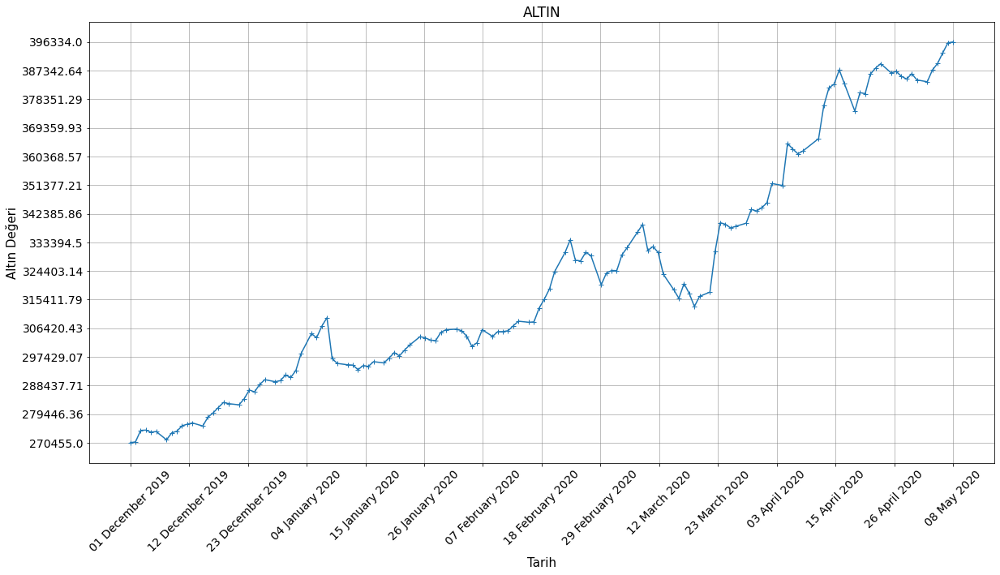

In [0]:
altin = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/GAU_TRY%20Ge%C3%A7mi%C5%9F%20Verileri.csv')
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','').astype('float')

altin['Şimdi'] = to_float(altin, 'Şimdi')
altin['Açılış'] = to_float(altin, 'Açılış')
altin['Yüksek'] = to_float(altin, 'Yüksek')
altin['Düşük'] = to_float(altin, 'Düşük')
altin['Fark %'] = to_float(altin, 'Fark %')
altin['Tarih'] = altin['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
altin['Tarih'] = pd.to_datetime(altin['Tarih'])
plt.figure(figsize=(20,10))
plt.plot(altin['Tarih'],altin['Yüksek'], marker='+')

plt.yticks(np.linspace(min(altin['Yüksek']), max(altin['Yüksek']), 15), np.round(np.linspace(min(altin['Yüksek']), max(altin['Yüksek']),15),2))
plt.xticks(np.linspace(altin['Tarih'].min().value, 
                       altin['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(altin['Tarih'].min().value, 
                       altin['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Altın Değeri', fontsize=15)
plt.title('ALTIN', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

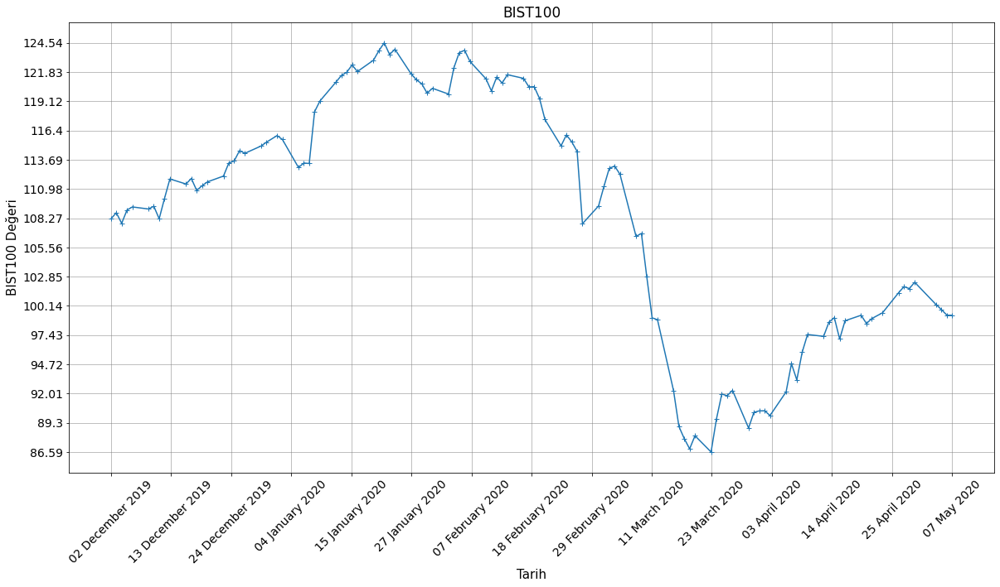

In [0]:
bist_100 = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/B%C4%B0ST%20100%20Ge%C3%A7mi%C5%9F%20Verileri.csv')
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','').astype('float') #Emre, kod farklı üstteki fonksiyonla bi yeri silme 

bist_100['Şimdi'] = to_float(bist_100, 'Şimdi')
bist_100['Açılış'] = to_float(bist_100, 'Açılış')
bist_100['Yüksek'] = to_float(bist_100, 'Yüksek')
bist_100['Düşük'] = to_float(bist_100, 'Düşük')
bist_100['Fark %'] = to_float(bist_100, 'Fark %')
bist_100['Tarih'] = bist_100['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
bist_100['Tarih'] = pd.to_datetime(bist_100['Tarih'])
plt.figure(figsize=(20,10))
plt.plot(bist_100['Tarih'],bist_100['Yüksek'], marker='+')

plt.yticks(np.linspace(min(bist_100['Yüksek']), max(bist_100['Yüksek']), 15), np.round(np.linspace(min(bist_100['Yüksek']), max(bist_100['Yüksek']),15),2))
plt.xticks(np.linspace(bist_100['Tarih'].min().value, 
                       bist_100['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(bist_100['Tarih'].min().value, 
                       bist_100['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('BIST100 Değeri', fontsize=15)
plt.title('BIST100', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

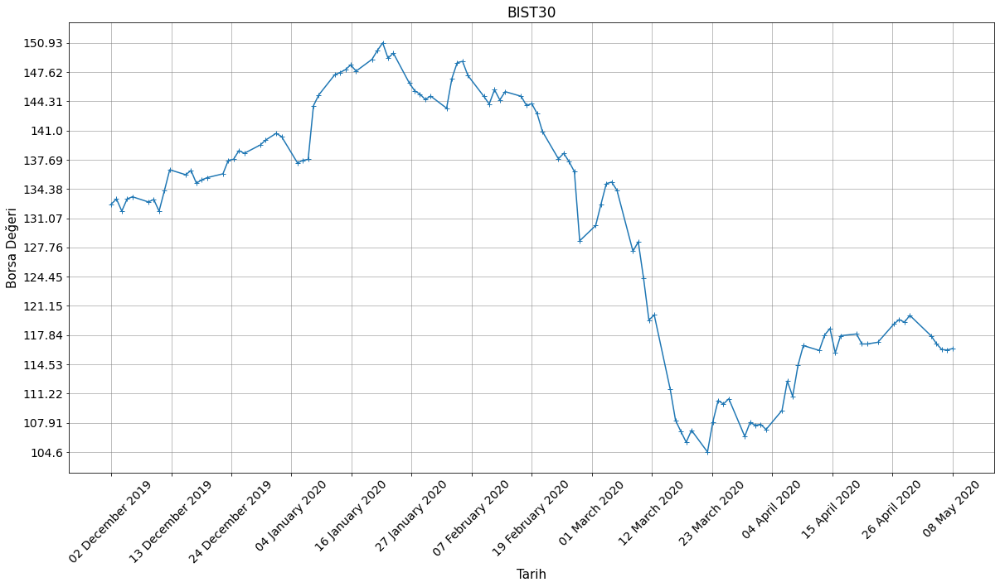

In [0]:
borsa = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/B%C4%B0ST%2030%20Ge%C3%A7mi%C5%9F%20Verileri.csv')
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','').astype('float')

borsa['Şimdi'] = to_float(borsa, 'Şimdi')
borsa['Açılış'] = to_float(borsa, 'Açılış')
borsa['Yüksek'] = to_float(borsa, 'Yüksek')
borsa['Düşük'] = to_float(borsa, 'Düşük')
borsa['Fark %'] = to_float(borsa, 'Fark %')
borsa['Tarih'] = borsa['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
borsa['Tarih'] = pd.to_datetime(borsa['Tarih'])
plt.figure(figsize=(20,10))
plt.plot(borsa['Tarih'],borsa['Yüksek'], marker='+')

plt.yticks(np.linspace(min(borsa['Yüksek']), max(borsa['Yüksek']), 15), np.round(np.linspace(min(borsa['Yüksek']), max(borsa['Yüksek']),15),2))
plt.xticks(np.linspace(borsa['Tarih'].min().value, 
                       borsa['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(borsa['Tarih'].min().value, 
                       borsa['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Borsa Değeri', fontsize=15)
plt.title('BIST30', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

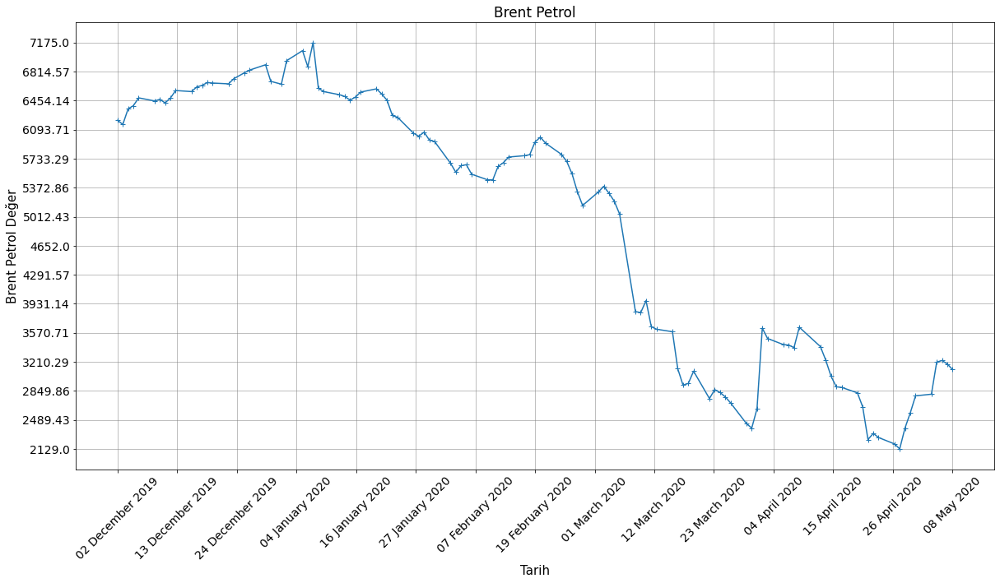

In [0]:
bent_petrol = pd.read_csv('https://raw.githubusercontent.com/yasntrk/Covid-19Analiz/master/Brent%20Petrol%20Vadeli%20%C4%B0%C5%9Flemleri%20Ge%C3%A7mi%C5%9F%20Verileri.csv')
def to_float(data, kolon):
  data[kolon] = data[kolon].str.strip('%')
  return data[kolon].str.replace(',','').astype('float')

bent_petrol['Şimdi'] = to_float(bent_petrol, 'Şimdi')
bent_petrol['Açılış'] = to_float(bent_petrol, 'Açılış')
bent_petrol['Yüksek'] = to_float(bent_petrol, 'Yüksek')
bent_petrol['Düşük'] = to_float(bent_petrol, 'Düşük')
bent_petrol['Fark %'] = to_float(bent_petrol, 'Fark %')
bent_petrol['Tarih'] = bent_petrol['Tarih'].str.replace(r'(\d+).(\d+).(\d+)', r'\3-\2-\1')
bent_petrol['Tarih'] = pd.to_datetime(bent_petrol['Tarih'])
plt.figure(figsize=(20,10))
plt.plot(bent_petrol['Tarih'],bent_petrol['Yüksek'], marker='+')

plt.yticks(np.linspace(min(bent_petrol['Yüksek']), max(bent_petrol['Yüksek']), 15), np.round(np.linspace(min(bent_petrol['Yüksek']), max(bent_petrol['Yüksek']),15),2))
plt.xticks(np.linspace(bent_petrol['Tarih'].min().value, 
                       bent_petrol['Tarih'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(bent_petrol['Tarih'].min().value, 
                       bent_petrol['Tarih'].max().value, 15)).strftime('%d %B %Y'), rotation=45)
plt.rc(['xtick','ytick'], labelsize=14)
plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Brent Petrol Değer', fontsize=15)
plt.title('Brent Petrol', fontsize=17)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.tick_params(axis ='x', rotation = 45) 

<h2> Aylara Kadar Gerçekleşen Uçak Trafiği ve Ziyaretçi Sayıları <h2/>

<p>•Türkiye'deki uçak trafiğinin Mart aylarında önceki yıla göre düşüş gösterdiğini görüyoruz. Bazı ülkelere yapılan seyahat sınırlamaları ve yapılan seyahat uyarılarının bu konuda etkili olduğunu görüyoruz.

<p>•Ülkemize gelen turist sayılarında -İran hariç- büyük düşüşler bulunmakta. Bunun ülkemize turizm ekonomisi olarak büyük etkilerinin olabileceğini söyleyenebilir. Özellikle turizm ekonomisi ile geçinen yerlerde büyük sorunlara yol açacaktır.
<p>•İran'dan ülkemizde gelen ziyaretçi sayısının önceki yıllara göre daha az düşüş yaşamasını iki nedeni olabilir.

1.   İran 2019 yılında yaşadığı iç ve dış sorunlarından dolayı ziyaretçi Türkiye'ye gelen ziyaretçi sayısının çok düşük olması.
2.   Salgının başlangıcından kısa bir süre sonra İran'da vaka ve ölüm sayısında artış olması ve virüsten kaçmak isteyen vatandaşların Türkiye'ye giriş yapması.



In [0]:
data_ucus_ocak = pd.read_excel('https://raw.githubusercontent.com/kynemre/Covid_19/master/Ucus_Verileri/Ocak.xlsx', header= 2)
data_ucus_subat = pd.read_excel('https://raw.githubusercontent.com/kynemre/Covid_19/master/Ucus_Verileri/%C5%9Eubat.xlsx', header= 2)
data_ucus_mart = pd.read_excel('https://raw.githubusercontent.com/kynemre/Covid_19/master/Ucus_Verileri/Mart.xlsx', header= 2)

In [0]:
data_ucus_ocak.rename(columns={'Unnamed: 0': 'Havalimanı'}, inplace=True)
data_ucus_subat.rename(columns={'Unnamed: 0': 'Havalimanı'}, inplace=True)
data_ucus_mart.rename(columns={'Unnamed: 0': 'Havalimanı'}, inplace=True)

In [0]:
aylar = ['Ocak', 'Subat', 'Mart']
veriler = [[data_ucus_ocak[data_ucus_ocak['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam'],
            data_ucus_ocak[data_ucus_ocak['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam.1']],
           [data_ucus_subat[data_ucus_subat['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam'],
            data_ucus_subat[data_ucus_subat['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam.1']],
           [data_ucus_mart[data_ucus_mart['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam'],
            data_ucus_mart[data_ucus_mart['Havalimanı'] == 'TÜRKİYE GENELİ'].iloc[0]['Toplam.1']]]
veriler = pd.DataFrame(veriler)
veriler.columns = [2019,2020]
veriler.index = aylar

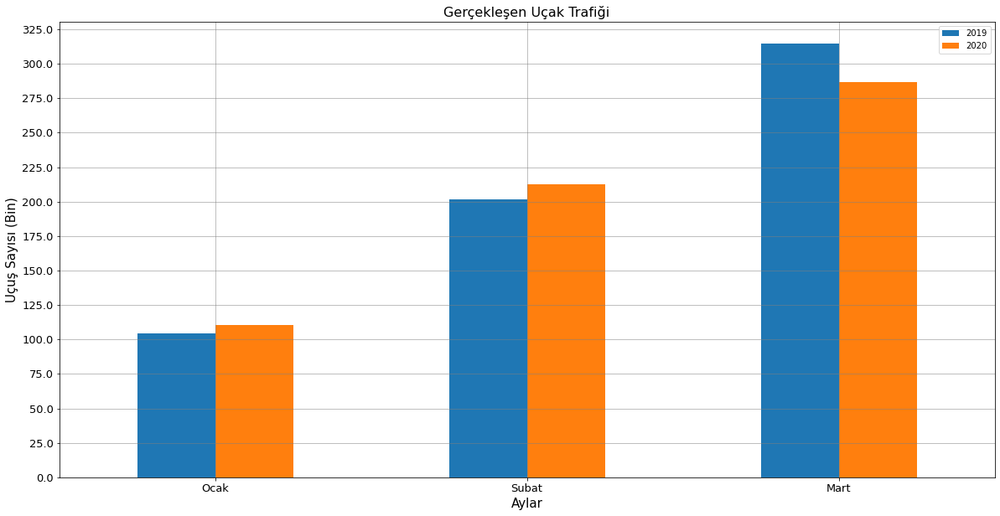

In [0]:
veriler.plot(kind='bar', fontsize=13, figsize=(20,10))
plt.yticks(np.arange(0, veriler[[2019,2020]].max().max()+25000, 25000),np.arange(0, veriler[[2019,2020]].max().max()+25000, 25000)//1000)
plt.xlabel('Aylar',fontsize=15)
plt.ylabel('Uçuş Sayısı (Bin)', fontsize=15)
plt.title("Gerçekleşen Uçak Trafiği", fontsize=16)
plt.tick_params(axis ='x', rotation = 0) 
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.legend()

In [0]:
data_turizm = pd.read_excel('https://raw.githubusercontent.com/kynemre/Covid_19/master/Turizm_Data_Subat.xls', sheet_name= 'Milliyet', header=2)

In [0]:
data_turizm.set_index('MİLLİYET', inplace = True)

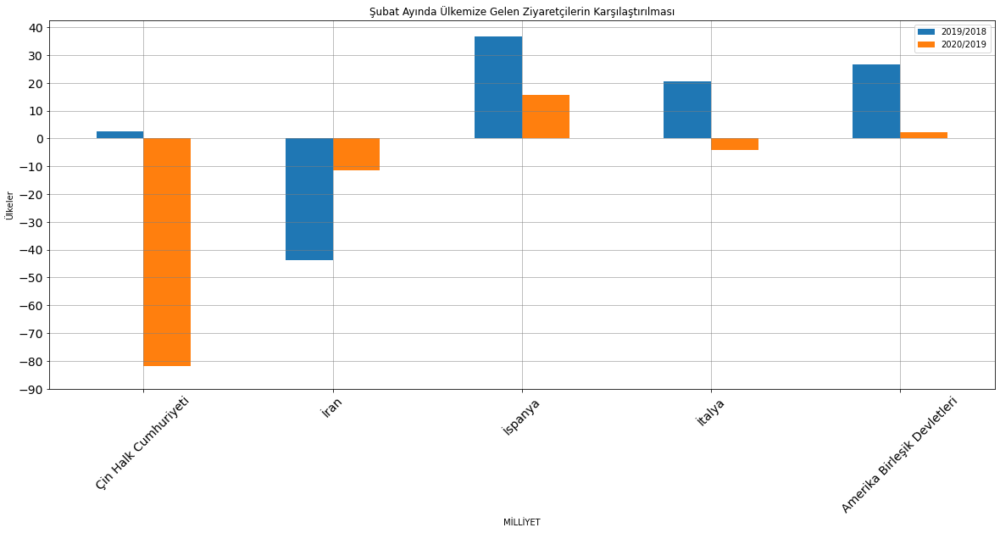

In [0]:
data_tur = data_turizm[(data_turizm.index == 'Çin Halk Cumhuriyeti') | (data_turizm.index == 'İtalya') 
| (data_turizm.index == 'Amerika Birleşik Devletleri') | (data_turizm.index == 'İran')
| (data_turizm.index == 'İspanya')][['2019/2018','2020/2019']].copy()

data_tur.plot(kind='bar', width = 0.5, figsize=(20,8))

plt.yticks(np.arange((data_tur.min().min()//10)*10, data_tur.max().max()+10, 10))
plt.title('Şubat Ayında Ülkemize Gelen Ziyaretçilerin Karşılaştırılması')
plt.ylabel('Yılların Yüzdelik Farkı')
plt.ylabel('Ülkeler')
plt.tick_params(axis ='x', rotation = 45) 
plt.grid(color='gray', linestyle='-', linewidth=0.5)


<h2> Geçmiş Verilerden Tahminlerde Bulunulması <h2/>

<p>• Salgınların seyri genel olarak birbirine benziyor. İlk vakadan sonra, kısa bir süreliğine yavaş bir yükseliş gerçekleşiyor. Salgının orta zamanlarında hızlı bir artışla günlük vaka ve ölüm sayıları pik değerine ulaşıp plato durumuna geçiyorlar. Ardından günlük vaka ve ölüm sayıları yok denecek kadar azalıyor.</p>

<p>• Aşağıdaki grafiklerde salgını bastırmayı başaran Çin'e bakarak bir tahmin grafiği çizdirdik.</p>


In [0]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

In [0]:
#Doğrusal modelleme
lr = LinearRegression()#obje oluşturma

#özellikleri ve özelliklerle kestireceğimiz hedeflenen değeri belirleyelim
y = data[data['Country/Region'] == 'China']['Deaths']#hedef, series
x = data[data['Country/Region'] == 'China'][['Confirmed']]#kullanılacak özellik, dataFrame 
lr.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [0]:
print("Kurulan model:")
print(' y = ',lr.intercept_, ' + ',lr.coef_[0], 'x')  
print(' Ölüm = ',lr.intercept_, ' + ',lr.coef_[0], '* Vaka')  

Kurulan model:
 y =  -550.4370717248962  +  0.05007293762458542 x
 Ölüm =  -550.4370717248962  +  0.05007293762458542 * Vaka


Linear regrasyonun hata payı fazla olduğu için işlemleri polinom regrasyon ile yapıyoruz.

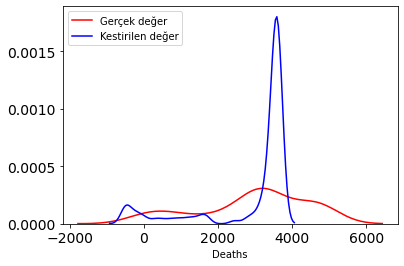

In [0]:
y_kestirilen = lr.predict(x)#modelle mözellikten kestirim yapılması
#Gerçek ve kestirilen değerlerin dağılımlarının çizimi
ax1 = sns.distplot(y,hist=False,color='r',label='Gerçek değer')
sns.distplot(y_kestirilen,hist=False,color='b',label='Kestirilen değer',ax=ax1)

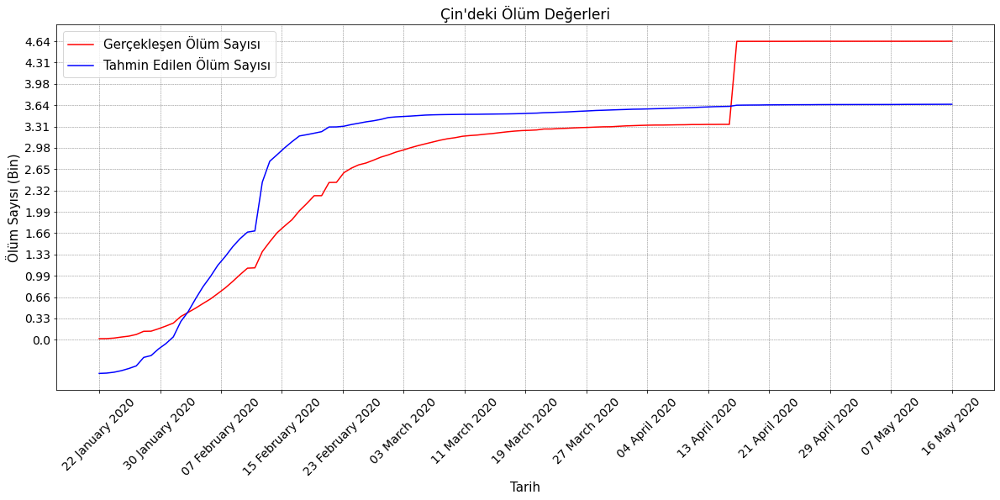

In [0]:
plt.figure(figsize=(20,8))
plt.plot(data[data['Country/Region'] == 'China']['Date'], y, c='red', label='Gerçekleşen Ölüm Sayısı ')
plt.plot(data[data['Country/Region'] == 'China']['Date'], y_kestirilen, c='blue', label='Tahmin Edilen Ölüm Sayısı')

plt.yticks(np.linspace(0, max(data[data['Country/Region'] == 'China']['Deaths']), 15),
           np.round(np.linspace(0, max(data[data['Country/Region'] == 'China']['Deaths']), 15)/1000,2))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       pd.to_datetime(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15)).strftime('%d %B %Y'), rotation=45)

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Ölüm Sayısı (Bin)', fontsize=15)
plt.title("Çin'deki Ölüm Değerleri", fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)

In [0]:
X = df[df['Country/Region'] == 'China'][['Date']].iloc[:80].values-52
y = data[data['Country/Region'] == 'China']['Deaths'].iloc[:80].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [0]:
lr = LinearRegression()
poly = PolynomialFeatures(degree=9)

In [0]:
egitim_poly = poly.fit_transform(X)
lr.fit(egitim_poly, y)
predict = lr.predict(egitim_poly)

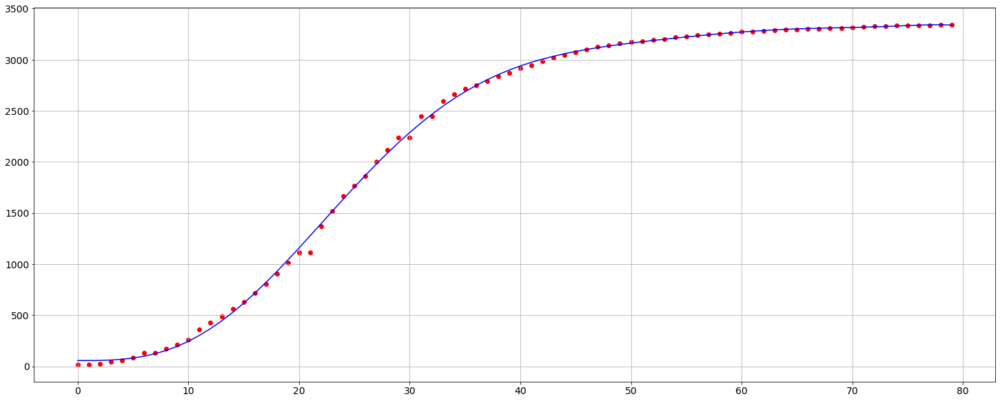

In [0]:
plt.figure(figsize=(25,10))
plt.scatter(X, y, color='red')
plt.plot(X, predict, color='blue')
plt.grid()
plt.show()

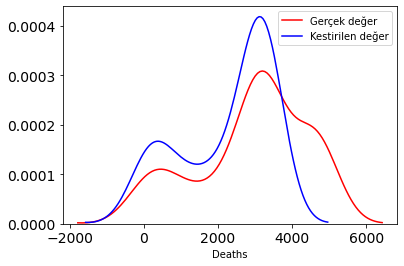

In [0]:
ax1 = sns.distplot(data[data['Country/Region'] == 'China']['Deaths'],hist=False,color='r',label='Gerçek değer')
sns.distplot(predict,hist=False,color='b',label='Kestirilen değer',ax=ax1)

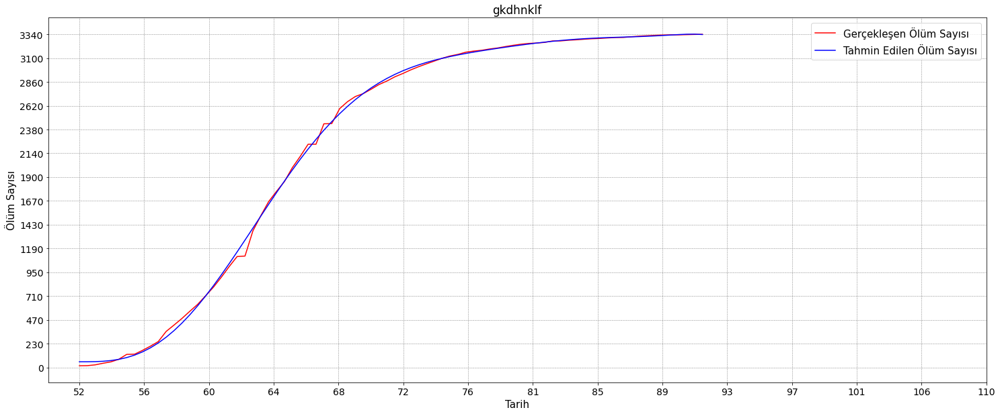

In [0]:
plt.figure(figsize=(25,10))

plt.plot(data[data['Country/Region'] == 'China']['Date'][:80], y, c='red', label='Gerçekleşen Ölüm Sayısı ')
plt.plot(data[data['Country/Region'] == 'China']['Date'][:80], predict, c='blue', label='Tahmin Edilen Ölüm Sayısı')

plt.yticks(np.linspace(0, max(y), 15),
           ((np.linspace(0, max(y), 15)//10)*10).astype('int'))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       np.linspace(52, (data['Date'][:80].max() - data['Date'].min()).days+52, 20).astype('int'))

plt.xlabel('Tarih', fontsize=15)
plt.ylabel('Ölüm Sayısı', fontsize=15)
plt.title('gkdhnklf', fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)


In [0]:
tahmin = lr.predict(poly.fit_transform(np.arange(80).reshape(-1,1)))

<h2> Geçmiş Verilerden Tahminlerde Bulunulması <h2/>

<p>• Türkiye'deki tahmin edilen ve şu anki ölüm eğrisi aşağıdaki gibidir.</p>

<p>• Grafiğin şu anki halinde tahminler ve gerçek değerler oldukça uyumlu. Günlük veka ve ölüm sayılarına bakılırsa da ölüm artışının bu seyirde gideceği öngörülebilir.</p>


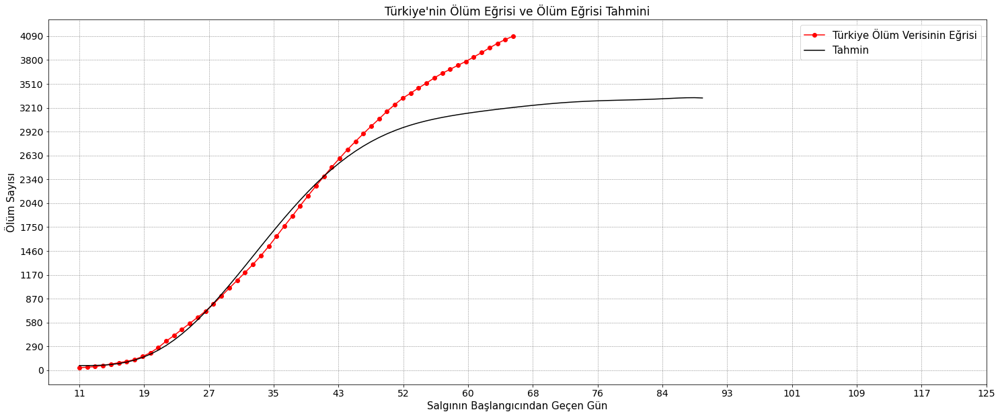

In [0]:
plt.figure(figsize=(25,10))

d = data[(data['Country/Region'] == 'Turkey') & (data['Deaths'] > 17)]['Deaths']
plt.plot(pd.date_range(data[data['Country/Region'] == 'China']['Date'].min(), 
                       periods=len(d)), d, marker='o', c='red', label="Türkiye Ölüm Verisinin Eğrisi")
plt.plot(data[data['Country/Region'] == 'China']['Date'][:80], tahmin, c='Black', label='Tahmin')

plt.yticks(np.linspace(0, max(d), 15),
           ((np.linspace(0, max(d), 15)//10)*10).astype('int'))
plt.xticks(np.linspace(data['Date'].min().value, 
                       data['Date'].max().value, 15).astype('datetime64[ns]'),
                       np.linspace(11, (data['Date'].max() - data['Date'].min()).days+52, 20).astype('int'))

plt.xlabel('Salgının Başlangıcından Geçen Gün', fontsize=15)
plt.ylabel('Ölüm Sayısı', fontsize=15)
plt.title("Türkiye'nin Ölüm Eğrisi ve Ölüm Eğrisi Tahmini", fontsize=17)

plt.grid(linestyle='dashed' ,color='gray', linewidth=0.5)
plt.legend(fontsize=15)


plt.savefig("Türkiye'nin Ölüm Eğrisi ve Ölüm Eğrisi Tahmini.png", bbox_inches='tight')